In [205]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [206]:
#Loading merged data for building task
#HumanAf = pd.read_csv('E:\HumanA\Data\Data_Tracy\Resulting_CSVs/humanA_Behavioural.csv')
HumanAf_build = pd.read_csv('E:\HumanA\Data\Data_Tracy\Resulting_CSVs/humanA_Behavioural_Building.csv')
HumanAf_build.drop('Unnamed: 0', axis=1, inplace=True)
HumanAf_build = HumanAf_build[HumanAf_build['avatarID_Building'].notna()]

HumanAf_build[["ID", "avatarID_Building"]] = HumanAf_build[["ID", "avatarID_Building"]].astype(int)
HumanAf_build[["ID", "avatarID_Building"]] = HumanAf_build[["ID", "avatarID_Building"]].apply(pd.Categorical)


HumanAf_build.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4251 entries, 0 to 4251
Data columns (total 28 columns):
 #   Column                                  Non-Null Count  Dtype   
---  ------                                  --------------  -----   
 0   ID                                      4251 non-null   category
 1   Alter                                   4251 non-null   float64 
 2   Global                                  4251 non-null   float64 
 3   Overview                                4251 non-null   float64 
 4   Cardinal                                4251 non-null   float64 
 5   AffiliativeQ_average                    3803 non-null   float64 
 6   item3                                   3803 non-null   float64 
 7   ContextQ_average                        3803 non-null   float64 
 8   remember_action_likert                  4027 non-null   float64 
 9   remember_standing_likert                4027 non-null   float64 
 10  attractive_action_likert                4027 non

In [207]:
#Loading merged data for agent task
HumanAf_Agent = pd.read_csv('E:\HumanA\Data\Data_Tracy\Resulting_CSVs/humanA_Behavioural_Agent.csv')
HumanAf_Agent.drop('Unnamed: 0', axis=1, inplace=True)
HumanAf_Agent = HumanAf_Agent[HumanAf_Agent['avatarID_Agent'].notna()]
HumanAf_Agent[["ID", "avatarID_Agent"]] = HumanAf_Agent[["ID", "avatarID_Agent"]].astype(int)
HumanAf_Agent[["ID", "avatarID_Agent"]] = HumanAf_Agent[["ID", "avatarID_Agent"]].apply(pd.Categorical)

HumanAf_Agent.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3192 entries, 0 to 3192
Data columns (total 29 columns):
 #   Column                               Non-Null Count  Dtype   
---  ------                               --------------  -----   
 0   ID                                   3192 non-null   category
 1   Alter                                3192 non-null   float64 
 2   Global                               3192 non-null   float64 
 3   Overview                             3192 non-null   float64 
 4   Cardinal                             3192 non-null   float64 
 5   AffiliativeQ_average                 2856 non-null   float64 
 6   item3                                2856 non-null   float64 
 7   ContextQ_average                     2856 non-null   float64 
 8   remember_action_likert               3024 non-null   float64 
 9   remember_standing_likert             3024 non-null   float64 
 10  attractive_action_likert             3024 non-null   float64 
 11  attractive_standi

In [208]:
#General plotting settings
sns.set(rc={"figure.figsize":(12, 8)})
sns.set(font_scale = 1.3)
plt.tight_layout()

<Figure size 864x576 with 0 Axes>

## Absolut Error

In [209]:
#Median absolut error Building Task by participant sorted from best to worst performer
absolut_error_sorted_building = pd.DataFrame(HumanAf_build.groupby('ID')['AbsolutError_Building'].median().sort_values())
absolut_error_sorted_building.head()

,AbsolutError_Building
ID,
5766,16.194861
4598,18.223629
1031,20.147808
5972,23.757277
5743,24.578828


In [210]:
#Median absolut error Agent Task by participant sorted from best to worst performer
absolut_error_sorted_agent = pd.DataFrame(HumanAf_Agent.groupby('ID')['AbsolutError_Agent'].median().sort_values())
absolut_error_sorted_agent.head()

,AbsolutError_Agent
ID,
1031,23.985322
4598,27.843257
5161,32.608170
5743,34.180021
5189,34.531755


In [211]:
# Calculating the subject median absolut pointing error Building Task by the factor meaningfulness
Medians_Build = pd.DataFrame(HumanAf_build.groupby(['ID', 'Context_Building'])['AbsolutError_Building'].median())
Medianss_Build = pd.DataFrame(Medians_Build.pivot_table(index='ID', columns='Context_Building', values='AbsolutError_Building'))
Medianss_Build.reset_index(inplace=True)
Medianss_Build.rename(columns={
    Medianss_Build.columns[1]: 'NotMeaning',
    Medianss_Build.columns[2]: 'Meaning'}, inplace=True)
Medianss_Build['diff'] = Medianss_Build['NotMeaning'] - Medianss_Build['Meaning']
Medianss_Build['sum'] = Medianss_Build['NotMeaning'] + Medianss_Build['Meaning']
Medianss_Build['norm'] = Medianss_Build['diff']/ Medianss_Build['sum']

In [212]:
# Calculating the subject median absolut pointing error Agent Task by the factor meaningfulness
Medians_Agent = pd.DataFrame(HumanAf_Agent.groupby(['ID', 'Context_Agent'])['AbsolutError_Agent'].median())
Medianss_Agent = pd.DataFrame(Medians_Agent.pivot_table(index='ID', columns='Context_Agent', values='AbsolutError_Agent'))
Medianss_Agent.reset_index(inplace=True)
Medianss_Agent.rename(columns={
    Medianss_Agent.columns[1]: 'NotMeaning',
    Medianss_Agent.columns[2]: 'Meaning'}, inplace=True)
Medianss_Agent['diff'] = Medianss_Agent['NotMeaning'] - Medianss_Agent['Meaning']
Medianss_Agent['sum']  = Medianss_Agent['NotMeaning'] + Medianss_Agent['Meaning']
Medianss_Agent['norm'] = Medianss_Agent['diff']/ Medianss_Agent['sum']

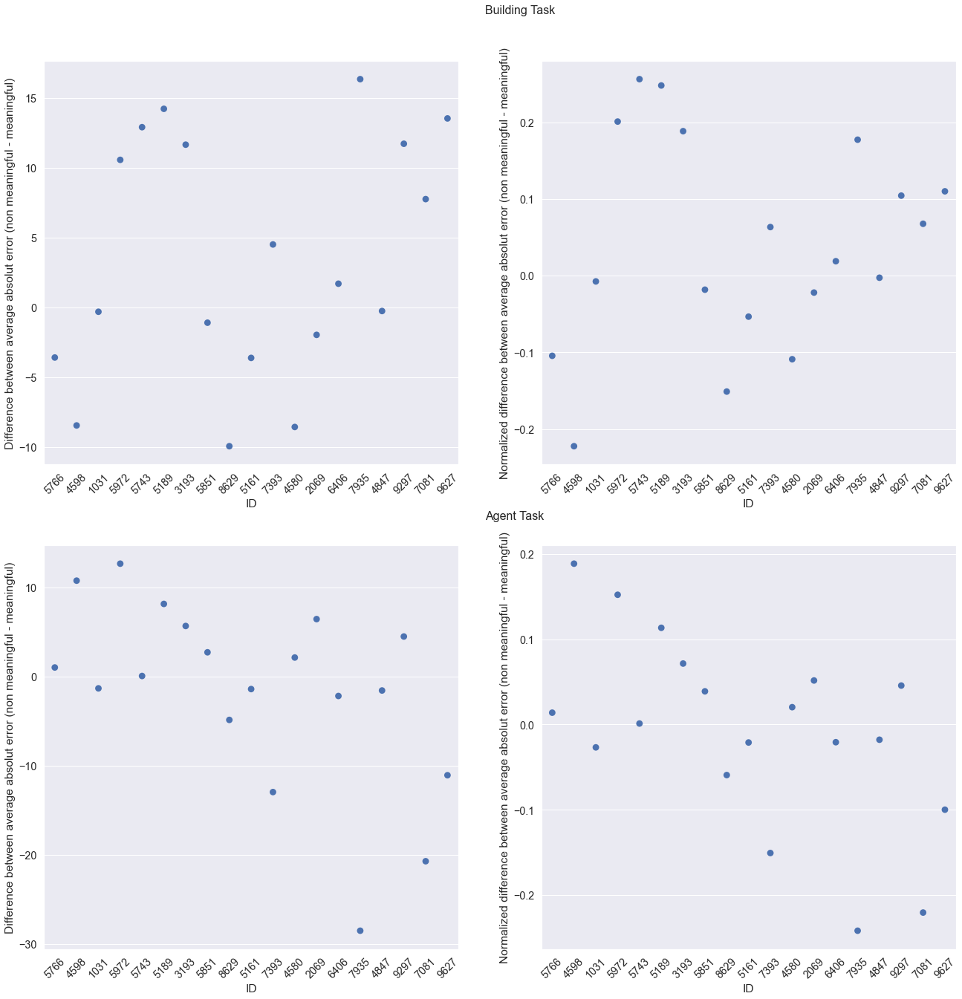

In [213]:
# plotting the subject median absolut pointing error by the factor meaningfulness
fig, axes = plt.subplots(2,2, figsize=(22,22))

# plot building task
sns.pointplot(data=Medianss_Build, x='ID', y='norm', order=absolut_error_sorted_building.index.values,join=False, ax=axes[0][1]).set(ylabel='Normalized difference between average absolut error (non meaningful - meaningful)')
sns.pointplot(data=Medianss_Build, x='ID', y='diff', order=absolut_error_sorted_building.index.values, join=False, ax=axes[0][0]).set(ylabel='Difference between average absolut error (non meaningful - meaningful)')
axes[0][0].set_xticklabels(axes[0][1].get_xticklabels(), rotation=45);
axes[0][1].set_xticklabels(axes[0][0].get_xticklabels(), rotation=45);

#plot agent task
sns.pointplot(data=Medianss_Agent, x='ID', y='norm', order=absolut_error_sorted_building.index.values,join=False, ax=axes[1][1]).set(ylabel='Normalized difference between average absolut error (non meaningful - meaningful)')
sns.pointplot(data=Medianss_Agent, x='ID', y='diff', order=absolut_error_sorted_building.index.values, join=False, ax=axes[1][0]).set(ylabel='Difference between average absolut error (non meaningful - meaningful)')
axes[1][0].set_xticklabels(axes[1][1].get_xticklabels(), rotation=45);
axes[1][1].set_xticklabels(axes[1][0].get_xticklabels(), rotation=45);

#axes[1][0].set_title('Normalized difference between average absolut error (non meaningful - meaningful)')
#axes[1][1].set_title('Difference between average absolut error (non meaningful - meaningful)')


fig.text(x=0.5, y=0.92, s="Building Task", fontsize = 16)
fig.text(x=0.5, y=0.49, s="Agent Task", fontsize = 16)

plt.show()

In [214]:
Medianss_Build.head(27)

Context_Building,ID,NotMeaning,Meaning,diff,sum,norm
0,1031,20.147808,20.448195,-0.300387,40.596003,-0.007399
1,2069,43.461371,45.413805,-1.952435,88.875176,-0.021968
2,3193,36.696409,25.043715,11.652694,61.740124,0.188738
3,4580,34.922422,43.464341,-8.541919,78.386763,-0.108971
4,4598,14.731149,23.163322,-8.432173,37.894471,-0.222517
5,4847,47.798468,48.045927,-0.247459,95.844395,-0.002582
6,5161,31.924247,35.525490,-3.601243,67.449737,-0.053392
7,5189,35.729490,21.512360,14.217130,57.241849,0.248370
8,5743,31.593098,18.689270,12.903829,50.282368,0.256627
9,5766,15.312200,18.885587,-3.573387,34.197788,-0.104492


In [215]:
Medianss_Agent.head(27)

Context_Agent,ID,NotMeaning,Meaning,diff,sum,norm
0,1031,23.766372,25.076154,-1.309782,48.842525,-0.026816
1,2069,65.864784,59.402797,6.461987,125.267581,0.051585
2,3193,42.667893,36.979542,5.688351,79.647435,0.071419
3,4580,54.042169,51.892976,2.149193,105.935144,0.020288
4,4598,33.978621,23.200733,10.777888,57.179354,0.188493
5,4847,42.650279,44.200324,-1.550045,86.850604,-0.017847
6,5161,32.246551,33.636856,-1.390305,65.883407,-0.021103
7,5189,40.114111,31.948203,8.165908,72.062314,0.113317
8,5743,34.257581,34.180021,0.077560,68.437602,0.001133
9,5766,37.789954,36.757713,1.032242,74.547667,0.013847


Text(0.5, 0.49, 'Agent Task')

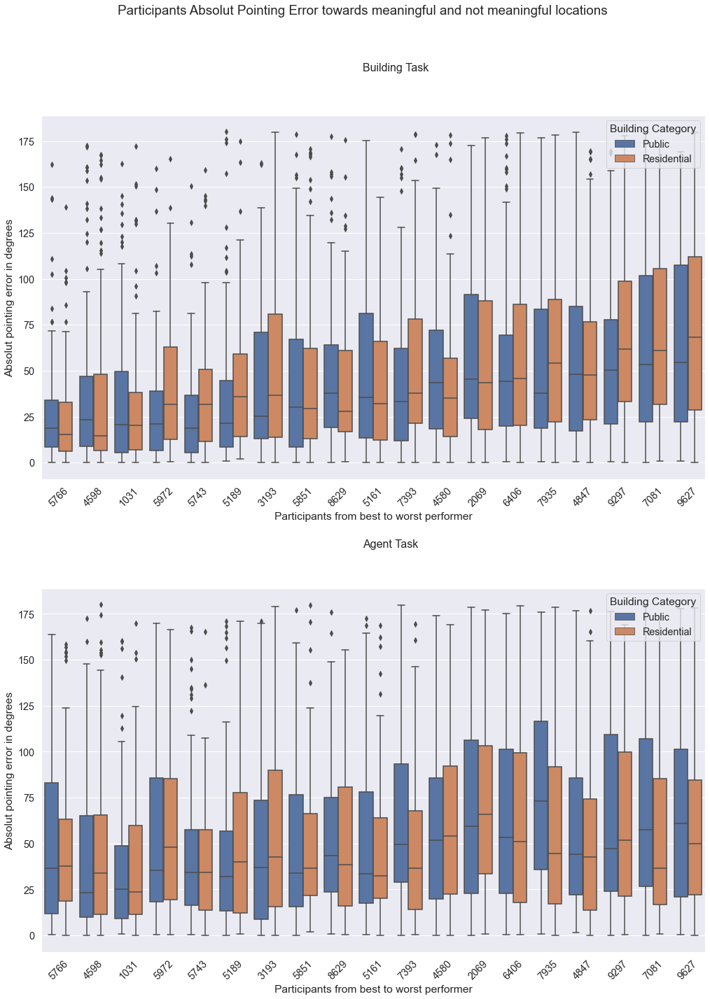

In [216]:
fig, axes = plt.subplots(2,1, figsize=(17,22))
plt.subplots_adjust(hspace = 0.3)
fig.suptitle('Participants Absolut Pointing Error towards meaningful and not meaningful locations')

sns.boxplot(x='ID', y='AbsolutError_Building', hue='BuildingCategory_Building', data=HumanAf_build, ax = axes[0], 
    order=absolut_error_sorted_building.index.values, hue_order = ['Public', 'Residential']).set()
axes[0].set(xlabel = 'Participants from best to worst performer')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45)
axes[0].set(ylabel = 'Absolut pointing error in degrees')
axes[0].legend(loc='upper right', title = 'Building Category')
#axes[0].get_legend().remove()

sns.boxplot(x='ID', y='AbsolutError_Agent', hue='BuildingCategory_Agent', data=HumanAf_Agent, ax = axes[1], 
    order=absolut_error_sorted_building.index.values, hue_order = ['Public', 'Residential']).set()
axes[1].set(xlabel = 'Participants from best to worst performer')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45)
axes[1].set(ylabel = 'Absolut pointing error in degrees')
axes[1].legend(loc='upper right', title = 'Building Category')
#axes[1].get_legend().remove()

fig.text(x=0.5, y=0.92, s="Building Task", fontsize = 16)
fig.text(x=0.5, y=0.49, s="Agent Task", fontsize = 16)

In [217]:
HumanAf_build[['ID', 'avatarID_Building', 'RT_Building']].sort_values(by = ['avatarID_Building', 'RT_Building'], ascending = [True, True], na_position = 'first').head(200)

,ID,avatarID_Building,RT_Building
51,8629,1,1.454277
3409,7393,1,1.622421
2303,5743,1,2.740910
740,1031,1,2.803393
3179,4580,1,2.868362
3180,4580,1,3.143145
1836,5766,1,3.410511
49,8629,1,3.542444
741,1031,1,3.621794
1837,5766,1,4.157981


In [218]:
HumanAf_Agent[['ID','avatarID_Agent','RT_Agent']].sort_values(by = ['avatarID_Agent', 'RT_Agent'], ascending = [True, True], na_position = 'first').head(200)

,ID,avatarID_Agent,RT_Agent
2457,4580,1,1.733021
1444,5766,1,2.186384
1120,9297,1,2.746820
954,5189,1,2.971532
2458,4580,1,3.199196
953,5189,1,3.656012
1279,7081,1,3.831588
776,4847,1,4.038822
2456,4580,1,4.062729
1608,6406,1,4.105412


In [219]:
BuildingNames= pd.read_csv('E:\HumanA\Data\Data_Tracy\Resulting_CSVs\BuildingLabels.csv')
HumanAfb_build = pd.merge(HumanAf_build, BuildingNames, left_on='avatarID_Building', right_on='avatarID').drop('avatarID', axis=1)
HumanAfb_build.rename(columns = {'BuildingName':'BuildingName_Building'}, inplace = True)
HumanAfb_Agent = pd.merge(HumanAf_Agent, BuildingNames, left_on='avatarID_Agent', right_on='avatarID').drop('avatarID', axis=1)
HumanAfb_Agent.rename(columns = {'BuildingName':'BuildingName_Agent'}, inplace = True)
#HumanAfb = pd.merge(HumanAf,BuildingNames,on='avatarID')
HumanAfb_Agent.head()

,ID,Alter,Global,Overview,Cardinal,AffiliativeQ_average,item3,ContextQ_average,remember_action_likert,remember_standing_likert,attractive_action_likert,attractive_standing_likert,realistic_action_likert,realistic_standing_likert,AbsolutError_Agent,SignedAngle-+180_Agent,IQR_Agent,RT_Agent,DistanceToParticipant_Agent,PointingTaskStartingLocations_Agent,TrialNumber_Agent,StartPointID_Agent,ID_for_StartingPosition_Agent,avatarID_Agent,AvatarPresenceCategory_Agent,Context_Agent,BuildingCategory_Agent,AgentCategory_Agent,ImageName_Agent,BuildingName_Agent
0,8629,23.0,4.3,5.714286,2.0,5.8,2.0,4.5,3.714286,2.392857,2.142857,2.107143,3.892857,3.25,145.337061,145.337061,59.905337,6.467362,311.658508,26.0,98.0,17.0,2.0,16,Present,False,Residential,Active,16_SaAct_92_36,(MB) Sushi restaurant
1,8629,23.0,4.3,5.714286,2.0,5.8,2.0,4.5,3.714286,2.392857,2.142857,2.107143,3.892857,3.25,100.477186,-100.477186,59.905337,1.929940,330.035889,0.0,134.0,23.0,2.0,16,Present,False,Residential,Active,16_SaAct_92_36,(MB) Sushi restaurant
2,8629,23.0,4.3,5.714286,2.0,5.8,2.0,4.5,3.714286,2.392857,2.142857,2.107143,3.892857,3.25,16.195533,-16.195533,59.905337,11.566758,387.203583,6.0,151.0,26.0,1.0,16,Present,False,Residential,Active,16_SaAct_92_36,(MB) Sushi restaurant
3,4598,21.0,5.1,4.857143,2.5,3.8,4.0,5.5,3.642857,2.642857,2.464286,2.357143,4.000000,4.00,12.519909,-12.519909,55.165528,8.658679,194.112183,3.0,60.0,10.0,6.0,16,Present,False,Residential,Active,16_SaAct_92_36,(MB) Sushi restaurant
4,4598,21.0,5.1,4.857143,2.5,3.8,4.0,5.5,3.642857,2.642857,2.464286,2.357143,4.000000,4.00,38.159625,-38.159625,55.165528,4.887590,490.141846,5.0,74.0,13.0,2.0,16,Present,False,Residential,Active,16_SaAct_92_36,(MB) Sushi restaurant


In [220]:
BuildingNames.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56 entries, 0 to 55
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   BuildingName  56 non-null     object
 1   avatarID      56 non-null     int64 
dtypes: int64(1), object(1)
memory usage: 1.0+ KB


In [221]:
building_absolut_error_sorted = pd.DataFrame(HumanAfb_build.groupby('BuildingName_Building')['AbsolutError_Building'].median().sort_values())
building_absolut_error_sorted.head(56)

,AbsolutError_Building
BuildingName_Building,
(RH) red smoke,14.373831
(GL) Church,15.123674
(RH) Baloons,17.853096
(MB) Patisserie,18.130710
(RH) Gorilla,18.928629
(MB) Boulangerie,20.094193
(GL) Windmill,21.215657
(MB) Lotto shop,22.246004
(MB) Pub,23.482381


In [222]:
agent_absolut_error_sorted = pd.DataFrame(HumanAfb_Agent.groupby('BuildingName_Agent')['AbsolutError_Agent'].median().sort_values())
agent_absolut_error_sorted.head(56)

,AbsolutError_Agent
BuildingName_Agent,
(MB) Lotto shop,20.747690
(MB) Basketball Court,21.610015
(MB) Pizza place,24.964744
(MB) Construction site,27.214891
(MB) Car repair,27.949096
(RH) Tree,29.746590
(GL) Church,29.997443
(MB) Furniture store,30.522710
(MB) Sushi restaurant,32.294069


Text(0.5, 0.49, 'Agent Task')

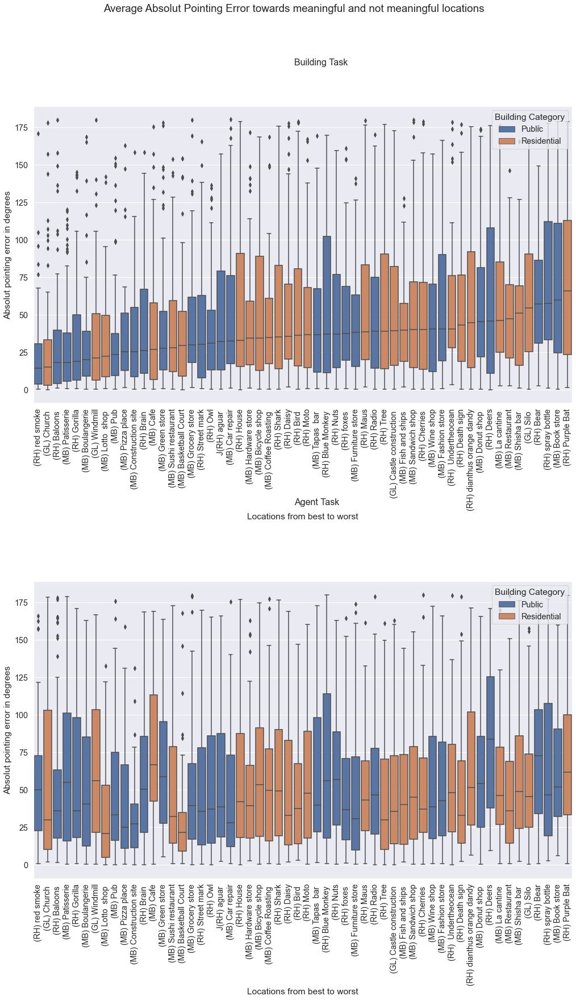

In [223]:
fig, axes = plt.subplots(2,1, figsize=(17,25))
plt.subplots_adjust(hspace = 0.6)
fig.suptitle('Average Absolut Pointing Error towards meaningful and not meaningful locations')

sns.boxplot(x='BuildingName_Building', y='AbsolutError_Building', order=building_absolut_error_sorted.index.values, 
    hue='BuildingCategory_Building', dodge=False, data=HumanAfb_build, ax = axes[0], hue_order = ['Public', 'Residential'])
axes[0].set(xlabel = 'Locations from best to worst')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=90)
axes[0].set(ylabel = 'Absolut pointing error in degrees')
axes[0].legend(loc='upper right', title = 'Building Category')
#axes[0].legend(loc=9, bbox_to_anchor=(1, 0.5))

sns.boxplot(x='BuildingName_Agent', y='AbsolutError_Agent', order=building_absolut_error_sorted.index.values, 
    hue='BuildingCategory_Agent', dodge=False, data=HumanAfb_Agent, ax = axes[1], hue_order = ['Public', 'Residential'])
axes[1].set(xlabel = 'Locations from best to worst')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=90)
axes[1].set(ylabel = 'Absolut pointing error in degrees')
axes[1].legend(loc='upper right', title = 'Building Category')

#axes[1].legend(loc=9, bbox_to_anchor=(1, 0.5))

fig.text(x=0.5, y=0.92, s="Building Task", fontsize = 16)
fig.text(x=0.5, y=0.49, s="Agent Task", fontsize = 16)

In [224]:
HumanAfb_build.to_csv('E:\HumanA\Data\Data_Tracy\Resulting_CSVs/buildingnames_building.csv')
HumanAfb_Agent.to_csv('E:\HumanA\Data\Data_Tracy\Resulting_CSVs/buildingnames_agent.csv')

In [225]:
from pingouin import friedman
#Package does Friedman on long data
#HumanAfb_build.head()
shops = friedman(data=HumanAfb_build, dv='AbsolutError_Building', within='BuildingName_Building', subject='ID')
shops

,Source,W,ddof1,Q,p-unc
Friedman,BuildingName_Building,0.268003,55,88.441103,0.00284


In [226]:
shops = friedman(data=HumanAfb_Agent, dv='AbsolutError_Agent', within='BuildingName_Agent', subject='ID')
shops

,Source,W,ddof1,Q,p-unc
Friedman,BuildingName_Agent,1.0,55,55.0,0.474637


In [227]:
# BUILDING TASK

import scikit_posthocs as sp
posthoc = sp.posthoc_dunn(HumanAfb_build, val_col='AbsolutError_Building', group_col='BuildingName_Building', p_adjust = 'bonferroni')
posthoc = posthoc.round(3)

def highlight_sig(s):
    is_sig = s < 0.0019
    return ['background-color: cyan' if v else '' for v in is_sig]

posthoccolor = posthoc.style.apply(highlight_sig)

In [228]:
pd.set_option("display.max_rows", None, "display.max_columns", None)

In [229]:
display(posthoccolor)

,(GL) Castle construction,(GL) Church,(GL) Silo,(GL) Windmill,(MB) Basketball Court,(MB) Bicycle shop,(MB) Book store,(MB) Boulangerie,(MB) Cafe,(MB) Car repair,(MB) Coffee Roasting,(MB) Construction site,(MB) Donut shop,(MB) Fashion store,(MB) Fish and ships,(MB) Furniture store,(MB) Green store,(MB) Grocery store,(MB) Hardware store,(MB) La cantine,(MB) Lotto shop,(MB) Patisserie,(MB) Pizza place,(MB) Pub,(MB) Restaurant,(MB) Sandwich shop,(MB) Shisha bar,(MB) Sushi restaurant,(MB) Tapas bar,(MB) Wine shop,(RH) Undertheocean,(RH) Baloons,(RH) Bear,(RH) Bird,(RH) Blue Monkey,(RH) Brain,(RH) Cherries,(RH) Daisy,(RH) Death sign,(RH) Deers,(RH) Gorilla,(RH) House,(RH) Maus,(RH) Moto,(RH) Nuts,(RH) Owl,(RH) Purple Bat,(RH) Radio,(RH) Shark,(RH) Street mark,(RH) Tree,(RH) dianthus orange dandy,(RH) foxes,(RH) red smoke,(RH) spray bottle,J(RH) aguar
(GL) Castle construction,1.000000,0.007000,1.000000,1.000000,1.000000,1.000000,1.000000,0.473000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.225000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.143000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000
(GL) Church,0.007000,1.000000,0.000000,1.000000,1.000000,0.975000,0.000000,1.000000,1.000000,0.022000,0.585000,1.000000,0.000000,0.013000,0.075000,1.000000,1.000000,0.603000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.042000,0.042000,1.000000,1.000000,1.000000,0.151000,0.000000,1.000000,0.000000,0.048000,0.051000,1.000000,0.041000,0.006000,0.006000,0.003000,1.000000,0.089000,0.002000,0.800000,0.086000,1.000000,0.000000,0.017000,0.112000,1.000000,0.003000,0.001000,0.132000,1.000000,0.000000,1.000000
(GL) Silo,1.000000,0.000000,1.000000,0.106000,1.000000,1.000000,1.000000,0.005000,1.000000,1.000000,1.000000,0.489000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.115000,0.003000,1.000000,0.046000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.001000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.022000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000
(GL) Windmill,1.000000,1.000000,0.106000,1.000000,1.000000,1.000000,0.017000,1.000000,1.000000,1.000000,1.000000,1.000000,0.445000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.388000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.311000,1.000000,0.001000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.001000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000
(MB) Basketball Court,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.541000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.038000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.070000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.009000,1.000000
(MB) Bicycle shop,1.000000,0.975000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.119000,1.000000,1.000000
(MB) Book store,1.

In [230]:
posthoc[posthoc <  0.001].count().sort_values(ascending=False)

(RH) red smoke                15
(RH) spray bottle              9
(GL) Church                    8
(RH) Bear                      7
(RH) Purple Bat                7
(MB) Patisserie                4
(MB) Book store                4
(RH) Baloons                   4
(MB) Pub                       3
(MB) Boulangerie               3
(RH) Gorilla                   3
(RH)  Undertheocean            2
(MB) La cantine                2
(MB) Donut shop                2
(GL) Silo                      2
(RH) Daisy                     1
(RH) Tree                      1
(RH) dianthus orange dandy     1
(RH) Death sign                1
(RH) Deers                     1
(GL) Windmill                  1
(MB) Lotto  shop               1
(RH) Maus                      1
(GL) Castle construction       1
(RH) Nuts                      0
(RH) House                     0
(RH) Moto                      0
(RH) Brain                     0
(RH) Owl                       0
(RH) Radio                     0
(RH) Shark

In [231]:
# AGENT TASK
# Question: is this right?
posthoc_agent = sp.posthoc_dunn(HumanAfb_Agent, val_col='AbsolutError_Agent', group_col='BuildingName_Agent', p_adjust = 'bonferroni')
posthoc_agent = posthoc_agent.round(3)

def highlight_sig(s):
    is_sig = s < 0.0019
    return ['background-color: cyan' if v else '' for v in is_sig]

posthoccolor_agent = posthoc_agent.style.apply(highlight_sig)
pd.set_option("display.max_rows", None, "display.max_columns", None)
display(posthoccolor)

,(GL) Castle construction,(GL) Church,(GL) Silo,(GL) Windmill,(MB) Basketball Court,(MB) Bicycle shop,(MB) Book store,(MB) Boulangerie,(MB) Cafe,(MB) Car repair,(MB) Coffee Roasting,(MB) Construction site,(MB) Donut shop,(MB) Fashion store,(MB) Fish and ships,(MB) Furniture store,(MB) Green store,(MB) Grocery store,(MB) Hardware store,(MB) La cantine,(MB) Lotto shop,(MB) Patisserie,(MB) Pizza place,(MB) Pub,(MB) Restaurant,(MB) Sandwich shop,(MB) Shisha bar,(MB) Sushi restaurant,(MB) Tapas bar,(MB) Wine shop,(RH) Undertheocean,(RH) Baloons,(RH) Bear,(RH) Bird,(RH) Blue Monkey,(RH) Brain,(RH) Cherries,(RH) Daisy,(RH) Death sign,(RH) Deers,(RH) Gorilla,(RH) House,(RH) Maus,(RH) Moto,(RH) Nuts,(RH) Owl,(RH) Purple Bat,(RH) Radio,(RH) Shark,(RH) Street mark,(RH) Tree,(RH) dianthus orange dandy,(RH) foxes,(RH) red smoke,(RH) spray bottle,J(RH) aguar
(GL) Castle construction,1.000000,0.007000,1.000000,1.000000,1.000000,1.000000,1.000000,0.473000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.225000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.143000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000
(GL) Church,0.007000,1.000000,0.000000,1.000000,1.000000,0.975000,0.000000,1.000000,1.000000,0.022000,0.585000,1.000000,0.000000,0.013000,0.075000,1.000000,1.000000,0.603000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.042000,0.042000,1.000000,1.000000,1.000000,0.151000,0.000000,1.000000,0.000000,0.048000,0.051000,1.000000,0.041000,0.006000,0.006000,0.003000,1.000000,0.089000,0.002000,0.800000,0.086000,1.000000,0.000000,0.017000,0.112000,1.000000,0.003000,0.001000,0.132000,1.000000,0.000000,1.000000
(GL) Silo,1.000000,0.000000,1.000000,0.106000,1.000000,1.000000,1.000000,0.005000,1.000000,1.000000,1.000000,0.489000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.115000,0.003000,1.000000,0.046000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.001000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.022000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000
(GL) Windmill,1.000000,1.000000,0.106000,1.000000,1.000000,1.000000,0.017000,1.000000,1.000000,1.000000,1.000000,1.000000,0.445000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.388000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.311000,1.000000,0.001000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.001000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000
(MB) Basketball Court,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.541000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.038000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.070000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.009000,1.000000
(MB) Bicycle shop,1.000000,0.975000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.119000,1.000000,1.000000
(MB) Book store,1.

Text(0.5, 1.0, 'Agent Task')

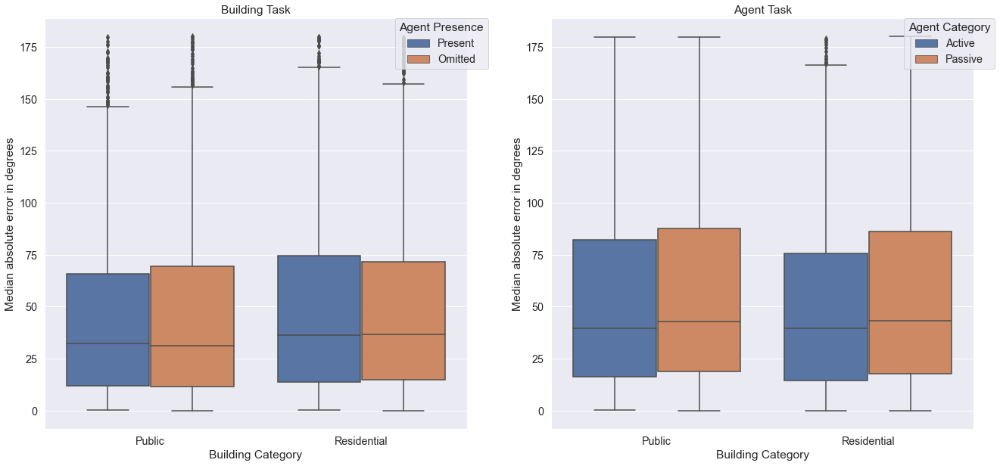

In [232]:
fig, axes = plt.subplots(1,2, figsize=(22,10))
sns.boxplot(y='AbsolutError_Building', x='BuildingCategory_Building', hue='AvatarPresenceCategory_Building', hue_order = ['Present', 'Omitted'], data=HumanAf_build, 
            ax = axes[0], order = ['Public', 'Residential'])
axes[0].set_ylabel('Median absolute error in degrees')
axes[0].set_xlabel('Building Category')
handles, labels = axes[0].get_legend_handles_labels()
#labels = ['Omitted', 'Present']
axes[0].legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=1, borderaxespad=0., title='Agent Presence')
axes[0].set_title('Building Task')

sns.boxplot(y='AbsolutError_Agent', x='BuildingCategory_Agent',hue='AgentCategory_Agent', hue_order = ['Active', 'Passive'],data=HumanAf_Agent, 
            ax = axes[1], order = ['Public', 'Residential'])
axes[1].set_ylabel('Median absolute error in degrees')
axes[1].set_xlabel('Building Category')
#axes[0].set_ylim(20, 50)
handles, labels = axes[1].get_legend_handles_labels()
#labels = ['Present']
axes[1].legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=1, borderaxespad=0., title='Agent Category')
axes[1].set_title('Agent Task')


Text(0.5, 0, 'Participants from best to worst performer')

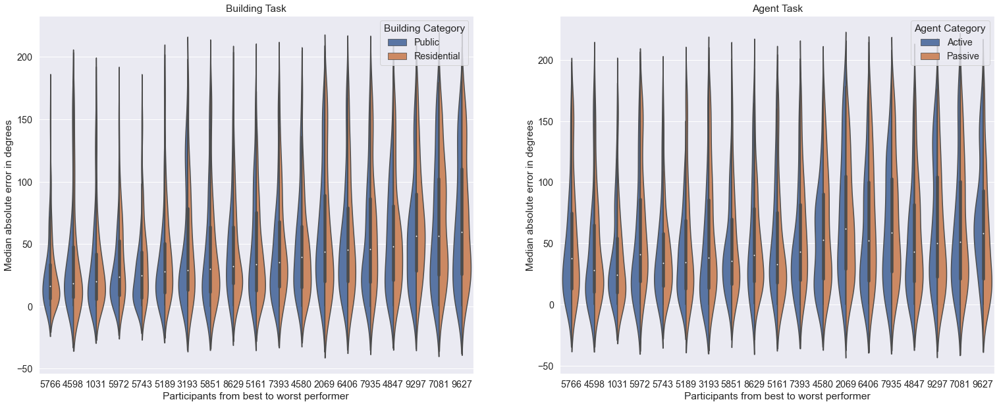

In [233]:

fig, axes = plt.subplots(1,2, figsize=(26,10))
sns.violinplot(y='AbsolutError_Building', hue='BuildingCategory_Building', x='ID', split=True,  data=HumanAf_build, 
               order=absolut_error_sorted_building.index.values, ax = axes[0], hue_order = ['Public', 'Residential'] )
axes[0].set_title('Building Task')
axes[0].set_ylabel('Median absolute error in degrees')
axes[0].set_xlabel('Participants from best to worst performer')
axes[0].legend(loc = 'upper right', title = 'Building Category')
sns.violinplot(y='AbsolutError_Agent', hue='AgentCategory_Agent', x='ID', split=True,  data=HumanAf_Agent, 
                order=absolut_error_sorted_building.index.values, ax = axes[1], hue_order = ['Active', 'Passive']  )
axes[1].legend(loc = 'upper right', title = 'Agent Category')
axes[1].set_title('Agent Task')
axes[1].set_ylabel('Median absolute error in degrees')
axes[1].set_xlabel('Participants from best to worst performer')

In [234]:
import math

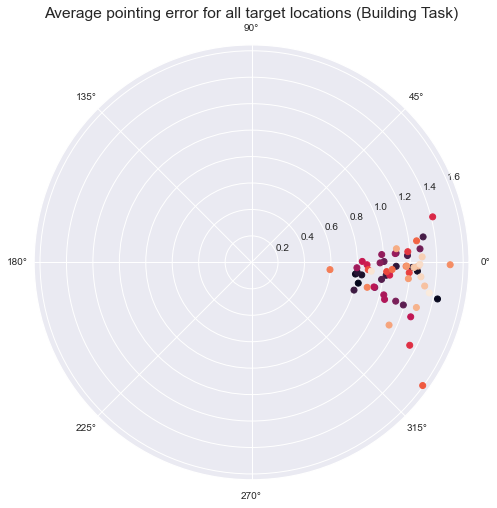

In [235]:
#fig, axes = plt.subplots(1,2, figsize=(22,10))

# Create a summary table with the median error for all locations
median_avatar_id = pd.DataFrame(HumanAf_build.groupby('avatarID_Building')['SignedAngle-+180_Building'].agg(['median','std']))
median_avatar_id['MedianRadians'] = [math.radians(median) for median in median_avatar_id['median']]
median_avatar_id['STDRadians'] = [math.radians(std) for std in median_avatar_id['std']]

# plotting the circle
plt.axes(projection='polar')
plt.scatter('MedianRadians', 'STDRadians', data=median_avatar_id, c=median_avatar_id.index.values)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.title('Average pointing error for all target locations (Building Task)')
# display the Polar plot
plt.show()

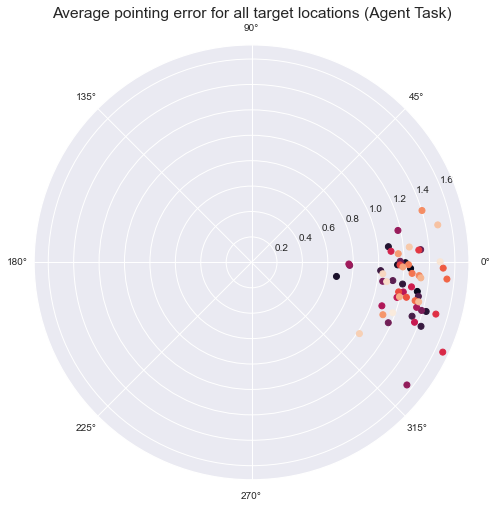

In [236]:
# Create a summary table with the median error for all locations
median_avatar_id = pd.DataFrame(HumanAf_Agent.groupby('avatarID_Agent')['SignedAngle-+180_Agent'].agg(['median','std']))
median_avatar_id['MedianRadians'] = [math.radians(median) for median in median_avatar_id['median']]
median_avatar_id['STDRadians'] = [math.radians(std) for std in median_avatar_id['std']]

# plotting the circle
plt.axes(projection='polar')
plt.scatter('MedianRadians', 'STDRadians', data=median_avatar_id, c=median_avatar_id.index.values)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.title('Average pointing error for all target locations (Agent Task)')
# display the Polar plot
plt.show()

## Response Time

In [237]:
RT_sorted = pd.DataFrame(HumanAf_build.groupby('ID')['RT_Building'].median().sort_values())
RT_sorted.head()

,RT_Building
ID,
8629,2.672208
7393,4.256437
7081,4.668589
5161,5.134364
2069,6.360273


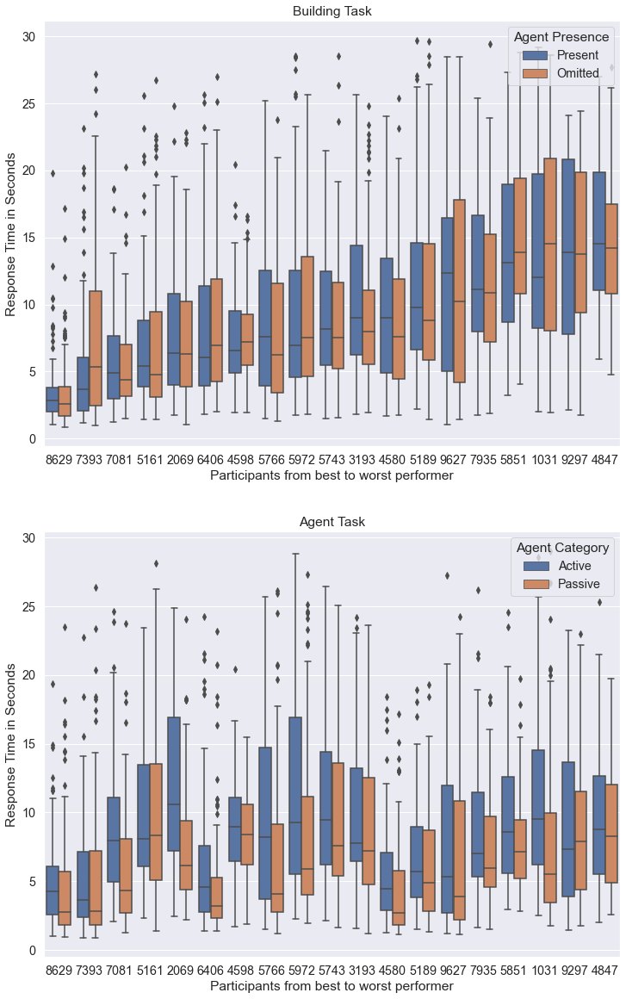

In [238]:
fig, axes = plt.subplots(2,1, figsize=(12,20))
sns.boxplot(x='ID', y='RT_Building', hue='AvatarPresenceCategory_Building', data=HumanAf_build, order=RT_sorted.index.values, 
            ax = axes[0])
axes[0].legend(loc='upper right', title = 'Agent Presence')
axes[0].set_title('Building Task')
axes[0].set_ylabel('Response Time in Seconds')
axes[0].set_xlabel('Participants from best to worst performer')
sns.boxplot(x='ID', y='RT_Agent', hue='AgentCategory_Agent', data=HumanAf_Agent, order=RT_sorted.index.values, 
            ax = axes[1])
axes[1].set_title('Agent Task')
axes[1].set_ylabel('Response Time in Seconds')
axes[1].set_xlabel('Participants from best to worst performer')
#plt.ylabel('Response time in seconds')
axes[1].legend(loc='upper right', title = 'Agent Category')

In [239]:
rounded_distances_building = pd.DataFrame(HumanAf_build.groupby(HumanAf_build['DistanceToParticipant_Building'].apply(
    lambda x: round(x, 1)))["AbsolutError_Building"].median())
rounded_distances_building.reset_index(inplace=True)

rounded_distances_agent = pd.DataFrame(HumanAf_Agent.groupby(HumanAf_Agent['DistanceToParticipant_Agent'].apply(
    lambda x: round(x, 1)))["AbsolutError_Agent"].median())
rounded_distances_agent.reset_index(inplace=True)

## Distance

Text(0.5, 0, 'Target distance to participant in meters')

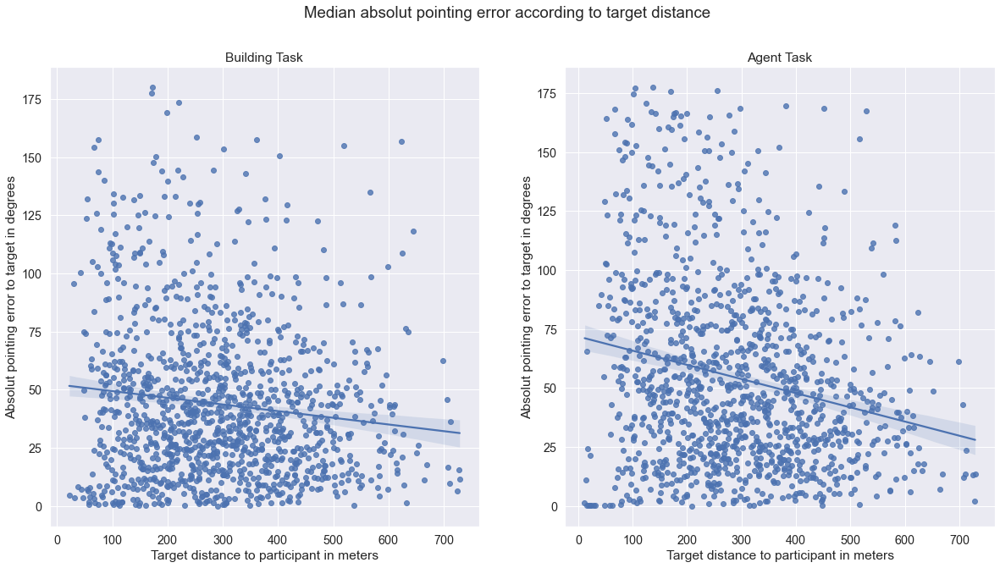

In [240]:
fig, axes = plt.subplots(1,2, figsize=(20,10))
fig.suptitle('Median absolut pointing error according to target distance')
sns.regplot(x="DistanceToParticipant_Building", y="AbsolutError_Building", data=rounded_distances_building, ax = axes[0])
sns.regplot(x="DistanceToParticipant_Agent", y="AbsolutError_Agent", data=rounded_distances_agent, ax = axes[1])

axes[0].set_title('Building Task')
axes[0].set_ylabel('Absolut pointing error to target in degrees')
axes[0].set_xlabel('Target distance to participant in meters')

axes[1].set_title('Agent Task')
axes[1].set_ylabel('Absolut pointing error to target in degrees')
axes[1].set_xlabel('Target distance to participant in meters')

#plt.title('Median absolut pointing error according to target distance')
#plt.xlabel('Target distance to participant in meters')
#plt.ylabel('Absolut pointing error to target in degrees ')

c:\Users\Kaya\anaconda3\lib\site-packages\seaborn\regression.py:592: UserWarning: sharex is deprecated from the `lmplot` function signature. Please update your code to pass it using `facet_kws`.
  warnings.warn(msg, UserWarning)
c:\Users\Kaya\anaconda3\lib\site-packages\seaborn\regression.py:592: UserWarning: sharey is deprecated from the `lmplot` function signature. Please update your code to pass it using `facet_kws`.
  warnings.warn(msg, UserWarning)


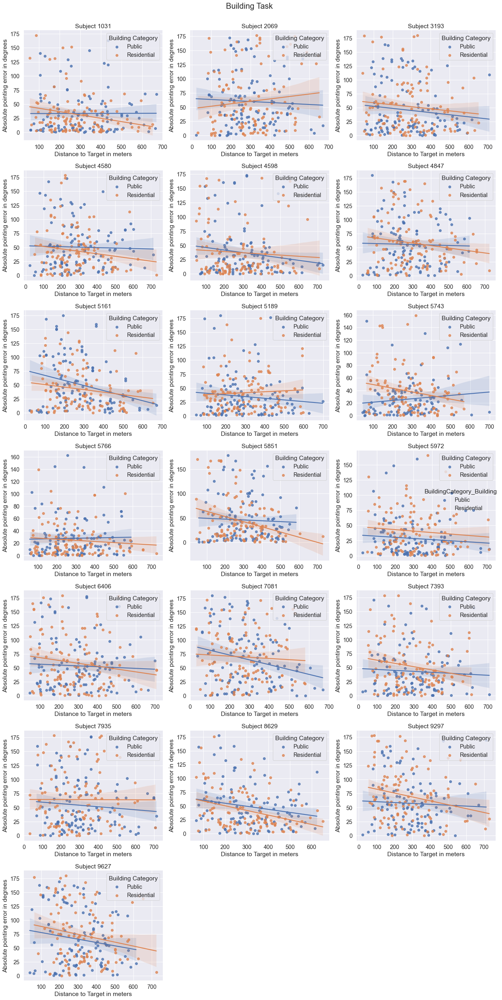

In [241]:
# BUILDING TASK

g = sns.lmplot(x="DistanceToParticipant_Building", y="AbsolutError_Building", data=HumanAf_build, hue='BuildingCategory_Building',col="ID", 
    col_wrap=3, sharex=False, sharey=False)
#plt.title('Building Task')
g.fig.suptitle("Building Task", x = 0.5, y = 1.0, fontsize = 20)
g.set_titles("Subject {col_name}")
#g.fig.suptitle('ONE TITLE FOR ALL')
#g.fig.subplots_adjust(hspace = 0.3)
#g.set_title("Building Task")
for ax in g.axes.ravel():
    ax.legend(loc='upper right', title = 'Building Category')
    ax.set_xlabel("Distance to Target in meters")
    ax.set_ylabel('Absolute pointing error in degrees')

plt.tight_layout()

c:\Users\Kaya\anaconda3\lib\site-packages\seaborn\regression.py:592: UserWarning: sharex is deprecated from the `lmplot` function signature. Please update your code to pass it using `facet_kws`.
  warnings.warn(msg, UserWarning)
c:\Users\Kaya\anaconda3\lib\site-packages\seaborn\regression.py:592: UserWarning: sharey is deprecated from the `lmplot` function signature. Please update your code to pass it using `facet_kws`.
  warnings.warn(msg, UserWarning)


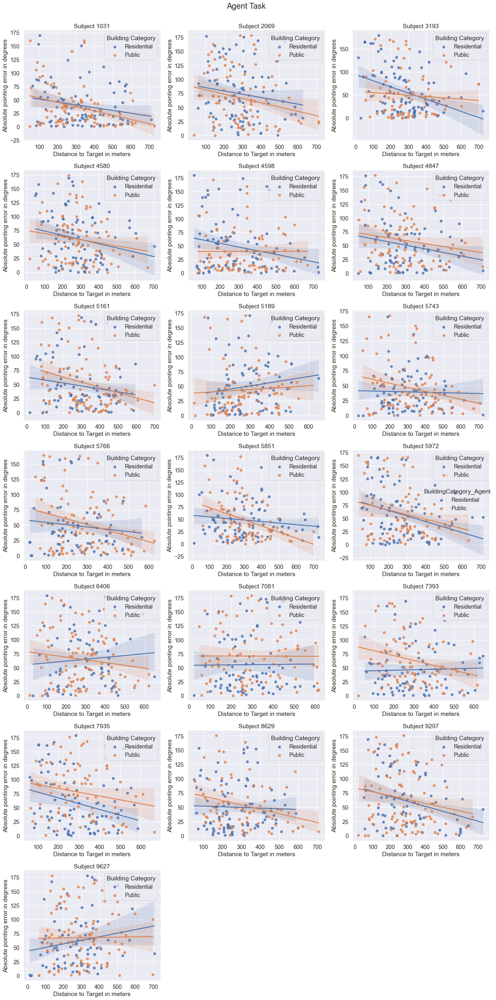

In [242]:
# AGENT TASK
g = sns.lmplot(x="DistanceToParticipant_Agent", y="AbsolutError_Agent", data=HumanAf_Agent, hue='BuildingCategory_Agent',col="ID", 
    col_wrap=3, sharex=False, sharey=False)
g.fig.suptitle("Agent Task", x = 0.5, y = 1.0, fontsize = 20)
g.set_titles("Subject {col_name}")

for ax in g.axes.ravel():
    ax.legend(loc='upper right', title = 'Building Category')
    ax.set_xlabel("Distance to Target in meters")
    ax.set_ylabel('Absolute pointing error in degrees')

plt.tight_layout()

c:\Users\Kaya\anaconda3\lib\site-packages\seaborn\regression.py:592: UserWarning: sharex is deprecated from the `lmplot` function signature. Please update your code to pass it using `facet_kws`.
  warnings.warn(msg, UserWarning)
c:\Users\Kaya\anaconda3\lib\site-packages\seaborn\regression.py:592: UserWarning: sharey is deprecated from the `lmplot` function signature. Please update your code to pass it using `facet_kws`.
  warnings.warn(msg, UserWarning)


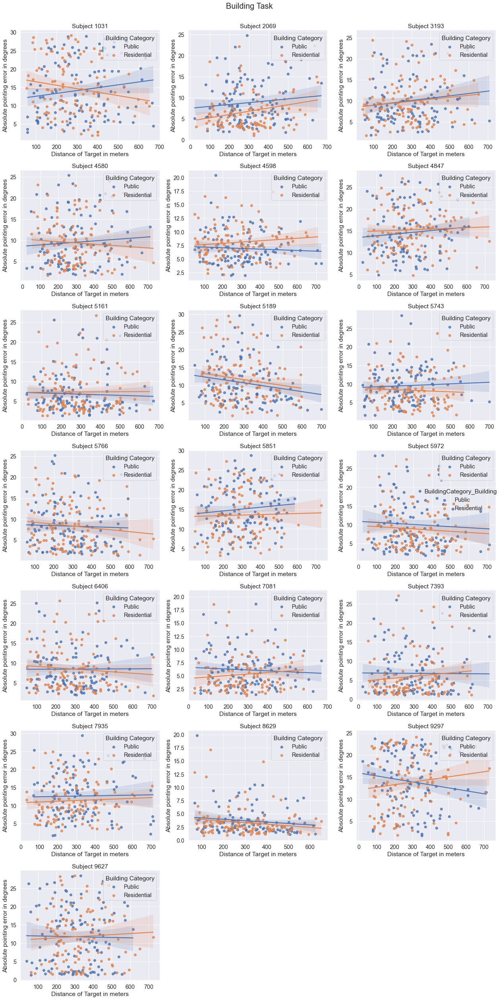

In [243]:
# BUILDING TASK

g = sns.lmplot(x="DistanceToParticipant_Building", y="RT_Building", data=HumanAf_build, hue='BuildingCategory_Building',col="ID", 
    col_wrap=3, sharex=False, sharey=False)
g.fig.suptitle("Building Task", x = 0.5, y = 1.0, fontsize = 20)
g.set_titles("Subject {col_name}")

for ax in g.axes.ravel():
    ax.legend(loc='upper right', title = 'Building Category')
    ax.set_xlabel("Distance of Target in meters")
    ax.set_ylabel('Absolute pointing error in degrees')

plt.tight_layout()

c:\Users\Kaya\anaconda3\lib\site-packages\seaborn\regression.py:592: UserWarning: sharex is deprecated from the `lmplot` function signature. Please update your code to pass it using `facet_kws`.
  warnings.warn(msg, UserWarning)
c:\Users\Kaya\anaconda3\lib\site-packages\seaborn\regression.py:592: UserWarning: sharey is deprecated from the `lmplot` function signature. Please update your code to pass it using `facet_kws`.
  warnings.warn(msg, UserWarning)


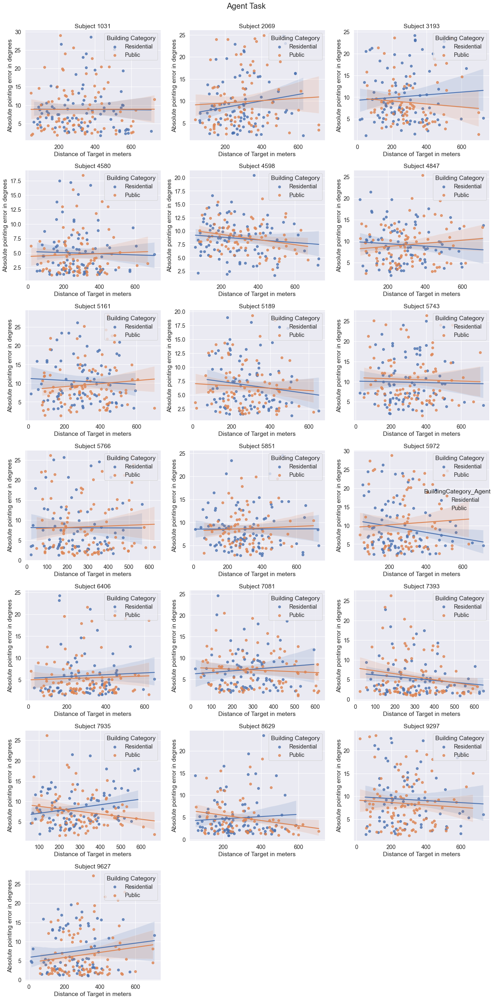

In [244]:
# AGENT TASK

g = sns.lmplot(x="DistanceToParticipant_Agent", y="RT_Agent", data=HumanAf_Agent, hue='BuildingCategory_Agent',col="ID", 
    col_wrap=3, sharex=False, sharey=False)
g.fig.suptitle("Agent Task", x = 0.5, y = 1.0, fontsize = 20)
g.set_titles("Subject {col_name}")

for ax in g.axes.ravel():
    ax.legend(loc='upper right', title = 'Building Category')
    ax.set_xlabel("Distance of Target in meters")
    ax.set_ylabel('Absolute pointing error in degrees')

plt.tight_layout()

## Order effects

Text(0.5, 0.49, 'Agent Task')

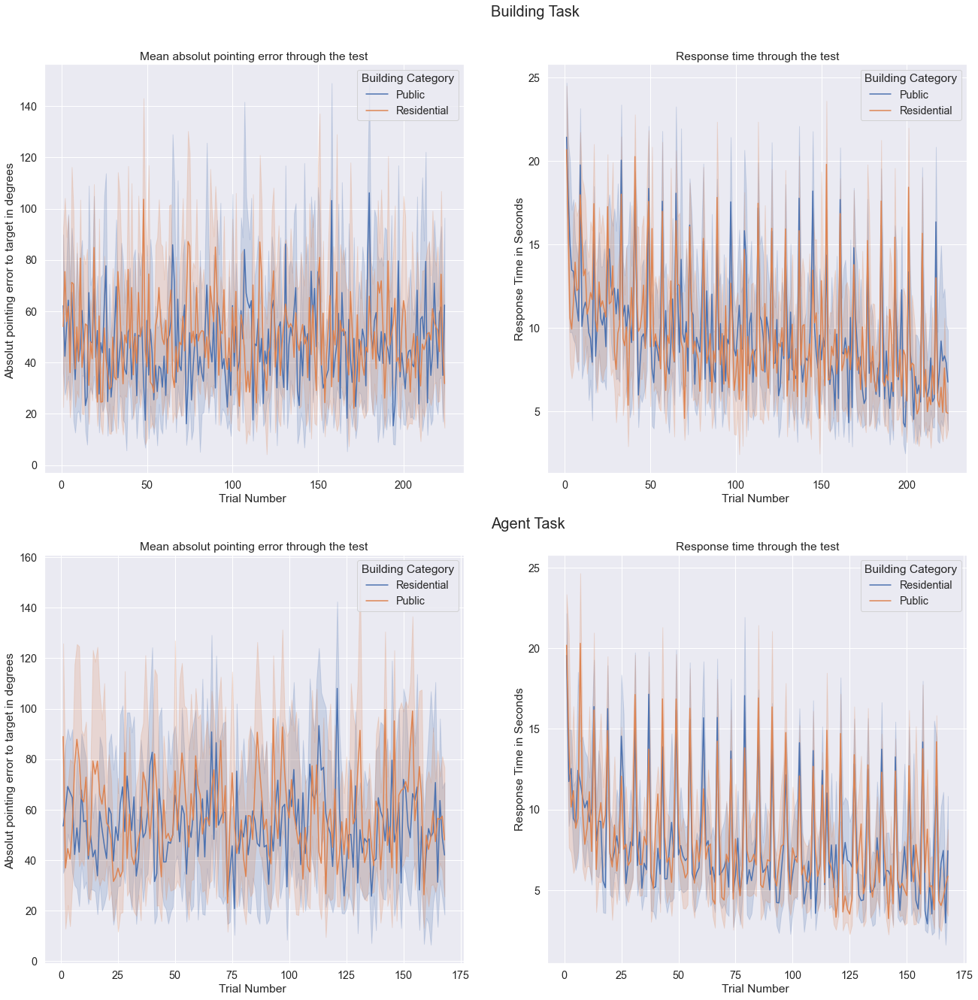

In [245]:
fig, axes = plt.subplots(2,2, figsize=(22,22))

sns.lineplot(data=HumanAf_build, x="TrialNumber_Building", y="AbsolutError_Building", hue='BuildingCategory_Building' , estimator='mean', 
    ci=95, ax=axes[0][0])
sns.lineplot(data=HumanAf_build, x="TrialNumber_Building", y="RT_Building", hue='BuildingCategory_Building' , estimator='mean', ci=95, ax=axes[0][1])
axes[0][0].set_title('Mean absolut pointing error through the test')
axes[0][1].set_title('Response time through the test')
axes[0][0].set_ylabel('Absolut pointing error to target in degrees ')
axes[0][1].set_ylabel('Response Time in Seconds')
axes[0][0].set_xlabel('Trial Number ')
axes[0][1].set_xlabel('Trial Number ')

axes[0][0].legend(loc='upper right', title = 'Building Category')
axes[0][1].legend(loc='upper right', title = 'Building Category')

sns.lineplot(data=HumanAf_Agent, x="TrialNumber_Agent", y="AbsolutError_Agent", hue='BuildingCategory_Agent' , estimator='mean', 
    ci=95, ax=axes[1][0])

sns.lineplot(data=HumanAf_Agent, x="TrialNumber_Agent", y="RT_Agent", hue='BuildingCategory_Agent' , estimator='mean', ci=95, ax=axes[1][1])

axes[1][0].set_title('Mean absolut pointing error through the test')
axes[1][1].set_title('Response time through the test')
axes[1][0].set_ylabel('Absolut pointing error to target in degrees ')
axes[1][1].set_ylabel('Response Time in Seconds')
axes[1][0].set_xlabel('Trial Number ')
axes[1][1].set_xlabel('Trial Number ')

axes[1][0].legend(loc='upper right', title = 'Building Category')
axes[1][1].legend(loc='upper right', title = 'Building Category')
#ax.legend(loc='upper right')

fig.text(x=0.5, y=0.92, s="Building Task", fontsize = 20)
fig.text(x=0.5, y=0.49, s="Agent Task", fontsize = 20)

Text(0.5, 0.49, 'Agent Task')

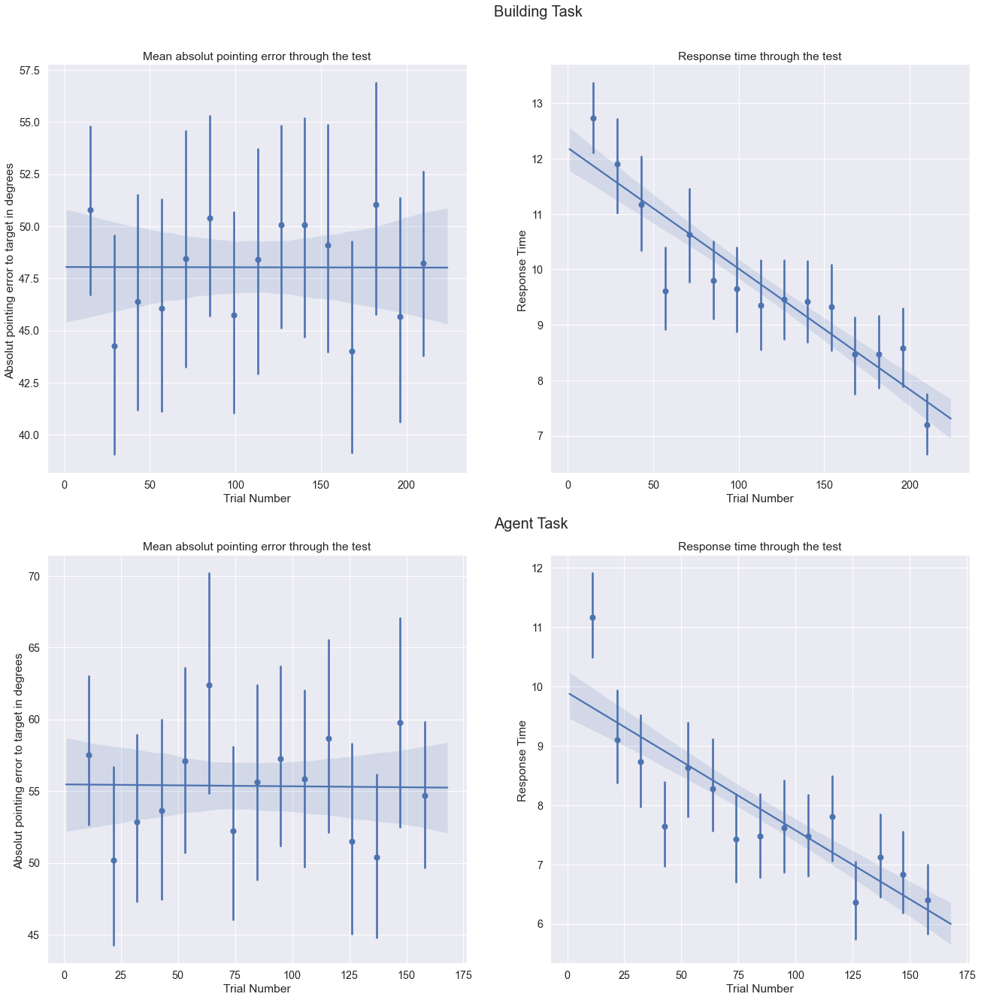

In [246]:
fig, axes = plt.subplots(2,2, figsize=(22,22))


sns.regplot(data=HumanAf_build, x="TrialNumber_Building", y="AbsolutError_Building", x_bins=15, ax=axes[0][0])
sns.regplot(data=HumanAf_build, x="TrialNumber_Building", y="RT_Building", x_bins=15, ax=axes[0][1])
sns.regplot(data=HumanAf_Agent, x="TrialNumber_Agent", y="AbsolutError_Agent", x_bins=15, ax=axes[1][0])
sns.regplot(data=HumanAf_Agent, x="TrialNumber_Agent", y="RT_Agent", x_bins=15, ax=axes[1][1])

axes[0][0].set_title('Mean absolut pointing error through the test')
axes[0][1].set_title('Response time through the test')
axes[0][0].set_ylabel('Absolut pointing error to target in degrees ')
axes[0][1].set_ylabel('Response Time ')
axes[0][0].set_xlabel('Trial Number')
axes[0][1].set_xlabel('Trial Number')

axes[1][0].set_title('Mean absolut pointing error through the test')
axes[1][1].set_title('Response time through the test')
axes[1][0].set_ylabel('Absolut pointing error to target in degrees ')
axes[1][1].set_ylabel('Response Time ')
axes[1][0].set_xlabel('Trial Number')
axes[1][1].set_xlabel('Trial Number')

fig.text(x=0.5, y=0.92, s="Building Task", fontsize = 20)
fig.text(x=0.5, y=0.49, s="Agent Task", fontsize = 20)

c:\Users\Kaya\anaconda3\lib\site-packages\seaborn\regression.py:592: UserWarning: sharex is deprecated from the `lmplot` function signature. Please update your code to pass it using `facet_kws`.
  warnings.warn(msg, UserWarning)
c:\Users\Kaya\anaconda3\lib\site-packages\seaborn\regression.py:592: UserWarning: sharey is deprecated from the `lmplot` function signature. Please update your code to pass it using `facet_kws`.
  warnings.warn(msg, UserWarning)


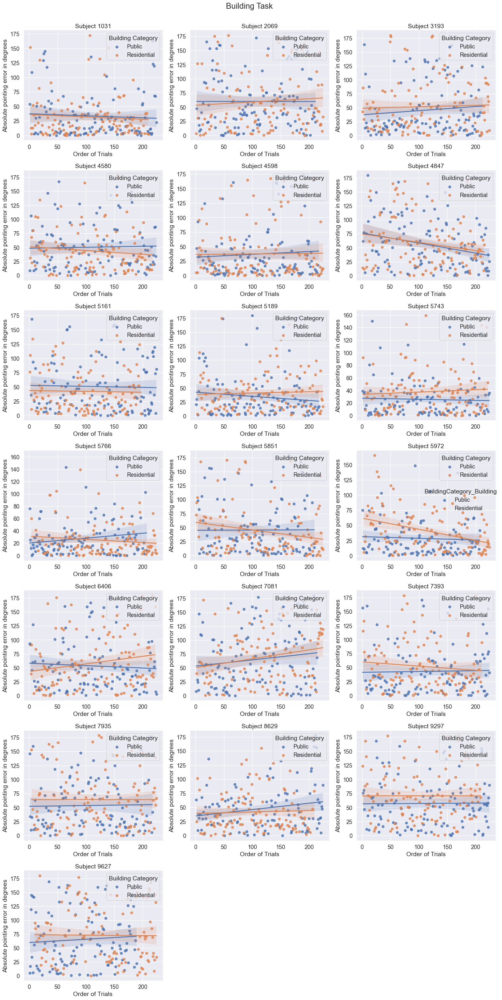

In [247]:
# BUILDING TASK
g = sns.lmplot(x="TrialNumber_Building", y="AbsolutError_Building", data=HumanAf_build, hue='BuildingCategory_Building',col="ID", col_wrap=3, sharex=False, sharey=False)
g.fig.suptitle("Building Task", x = 0.5, y = 1.0, fontsize = 20)
g.set_titles("Subject {col_name}")

for ax in g.axes.ravel():
    ax.legend(loc='upper right', title = 'Building Category')
    ax.set_xlabel("Order of Trials")
    ax.set_ylabel('Absolute pointing error in degrees')

plt.tight_layout()

c:\Users\Kaya\anaconda3\lib\site-packages\seaborn\regression.py:592: UserWarning: sharex is deprecated from the `lmplot` function signature. Please update your code to pass it using `facet_kws`.
  warnings.warn(msg, UserWarning)
c:\Users\Kaya\anaconda3\lib\site-packages\seaborn\regression.py:592: UserWarning: sharey is deprecated from the `lmplot` function signature. Please update your code to pass it using `facet_kws`.
  warnings.warn(msg, UserWarning)


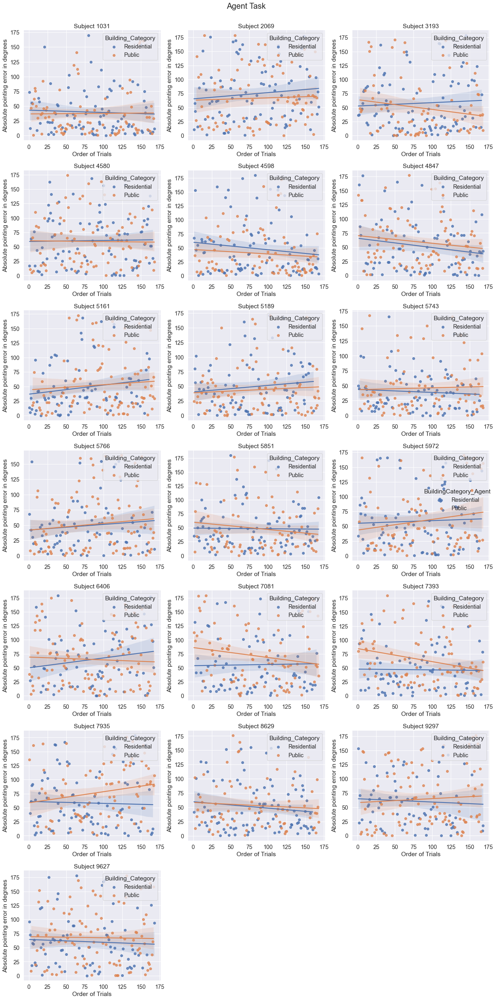

In [248]:
# AGENT TASK
g = sns.lmplot(x="TrialNumber_Agent", y="AbsolutError_Agent", data=HumanAf_Agent, hue='BuildingCategory_Agent',col="ID", col_wrap=3, 
               sharex=False, sharey=False)
g.fig.suptitle("Agent Task", x = 0.5, y = 1.0, fontsize = 20)
g.set_titles("Subject {col_name}")

for ax in g.axes.ravel():
    ax.legend(loc='upper right', title = 'Building_Category')
    ax.set_xlabel("Order of Trials")
    ax.set_ylabel('Absolute pointing error in degrees')

plt.tight_layout()

c:\Users\Kaya\anaconda3\lib\site-packages\seaborn\regression.py:592: UserWarning: sharex is deprecated from the `lmplot` function signature. Please update your code to pass it using `facet_kws`.
  warnings.warn(msg, UserWarning)
c:\Users\Kaya\anaconda3\lib\site-packages\seaborn\regression.py:592: UserWarning: sharey is deprecated from the `lmplot` function signature. Please update your code to pass it using `facet_kws`.
  warnings.warn(msg, UserWarning)


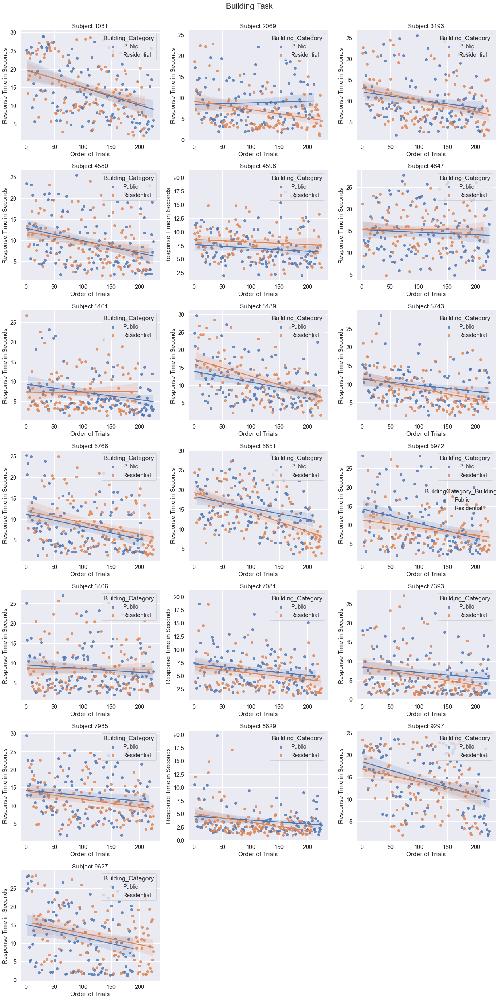

In [249]:
# BUILDING TASK

g = sns.lmplot(x="TrialNumber_Building", y="RT_Building", data=HumanAf_build, hue='BuildingCategory_Building',col="ID", col_wrap=3, sharex=False, sharey=False)
g.fig.suptitle("Building Task", x = 0.5, y = 1.0, fontsize = 20)
g.set_titles("Subject {col_name}")

for ax in g.axes.ravel():
    ax.legend(loc='upper right', title = 'Building_Category')
    ax.set_xlabel("Order of Trials")
    ax.set_ylabel('Response Time in Seconds')

plt.tight_layout()

c:\Users\Kaya\anaconda3\lib\site-packages\seaborn\regression.py:592: UserWarning: sharex is deprecated from the `lmplot` function signature. Please update your code to pass it using `facet_kws`.
  warnings.warn(msg, UserWarning)
c:\Users\Kaya\anaconda3\lib\site-packages\seaborn\regression.py:592: UserWarning: sharey is deprecated from the `lmplot` function signature. Please update your code to pass it using `facet_kws`.
  warnings.warn(msg, UserWarning)


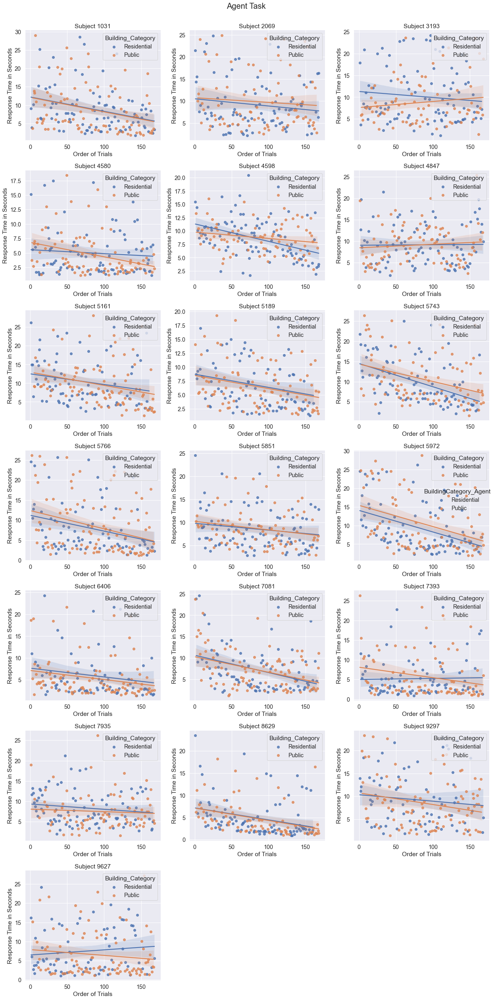

In [250]:
# AGENT TASK

g = sns.lmplot(x="TrialNumber_Agent", y="RT_Agent", data=HumanAf_Agent, hue='BuildingCategory_Agent',col="ID", col_wrap=3, sharex=False, sharey=False)
g.fig.suptitle("Agent Task", x = 0.5, y = 1.0, fontsize = 20)
g.set_titles("Subject {col_name}")

for ax in g.axes.ravel():
    ax.legend(loc='upper right', title = 'Building_Category')
    ax.set_xlabel("Order of Trials")
    ax.set_ylabel('Response Time in Seconds')

plt.tight_layout()

In [251]:
import numpy as np

Text(0.5, 0.49, 'Agent Task')

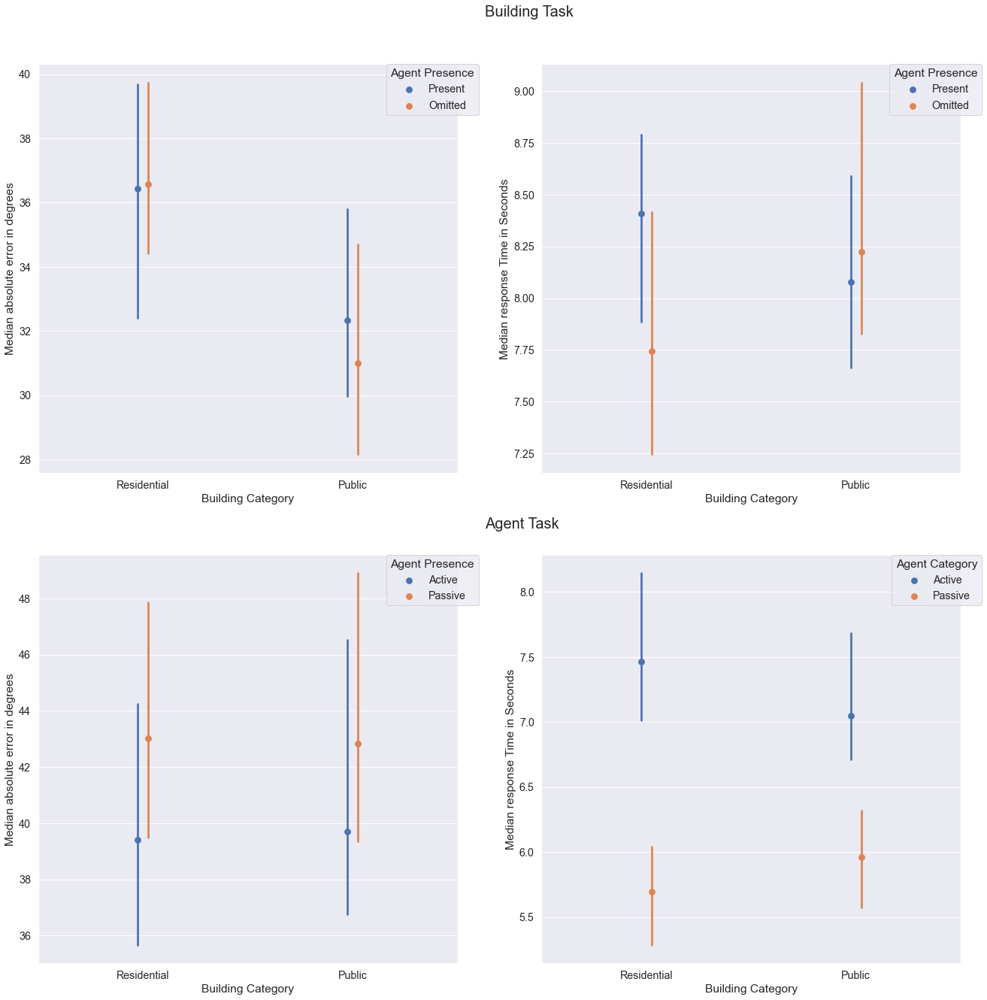

In [252]:
fig, axes = plt.subplots(2,2, figsize=(22,22))

# BUILDING TASK
sns.pointplot(x='Context_Building', y='AbsolutError_Building', hue='AvatarPresenceCategory_Building', dodge=True, data=HumanAf_build,
              ci=95, estimator=np.median, join=False, ax=axes[0][0], order = [False, True])
axes[0][0].set_xticklabels(['Residential', 'Public'])
axes[0][0].set_ylabel('Median absolute error in degrees')
axes[0][0].set_xlabel('Building Category')

handles, labels = axes[0][0].get_legend_handles_labels()

axes[0][0].legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=1, borderaxespad=0., title='Agent Presence')


sns.pointplot(x='Context_Building', y='RT_Building',hue='AvatarPresenceCategory_Building', dodge=True, data=HumanAf_build,
              ci=95, estimator=np.median,join=False,  ax=axes[0][1], order = [False, True])
axes[0][1].set_xticklabels(['Residential', 'Public'])
axes[0][1].set_ylabel('Median response Time in Seconds')
axes[0][1].set_xlabel('Building Category')

handles, labels = axes[0][1].get_legend_handles_labels()
axes[0][1].legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=1, borderaxespad=0., title='Agent Presence')

# AGENT TASK
sns.pointplot(x='Context_Agent', y='AbsolutError_Agent', dodge=True, data=HumanAf_Agent,
              ci=95, estimator=np.median, join=False, ax=axes[1][0], order = [False, True], hue = 'AgentCategory_Agent')
axes[1][0].set_xticklabels(['Residential', 'Public'])
axes[1][0].set_ylabel('Median absolute error in degrees')
axes[1][0].set_xlabel('Building Category')

handles, labels = axes[1][0].get_legend_handles_labels()

axes[1][0].legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=1, borderaxespad=0., title='Agent Presence')


sns.pointplot(x='Context_Agent', y='RT_Agent',dodge=True, data=HumanAf_Agent,
              ci=95, estimator=np.median,join=False,  ax=axes[1][1], order = [False, True], hue = 'AgentCategory_Agent')
axes[1][1].set_xticklabels(['Residential', 'Public'])
axes[1][1].set_ylabel('Median response Time in Seconds')
axes[1][1].set_xlabel('Building Category')

handles, labels = axes[1][1].get_legend_handles_labels()
axes[1][1].legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=1, borderaxespad=0., title='Agent Category')

fig.text(x=0.5, y=0.92, s="Building Task", fontsize = 20)
fig.text(x=0.5, y=0.49, s="Agent Task", fontsize = 20)

Text(0.5, 0.49, 'Agent Task')

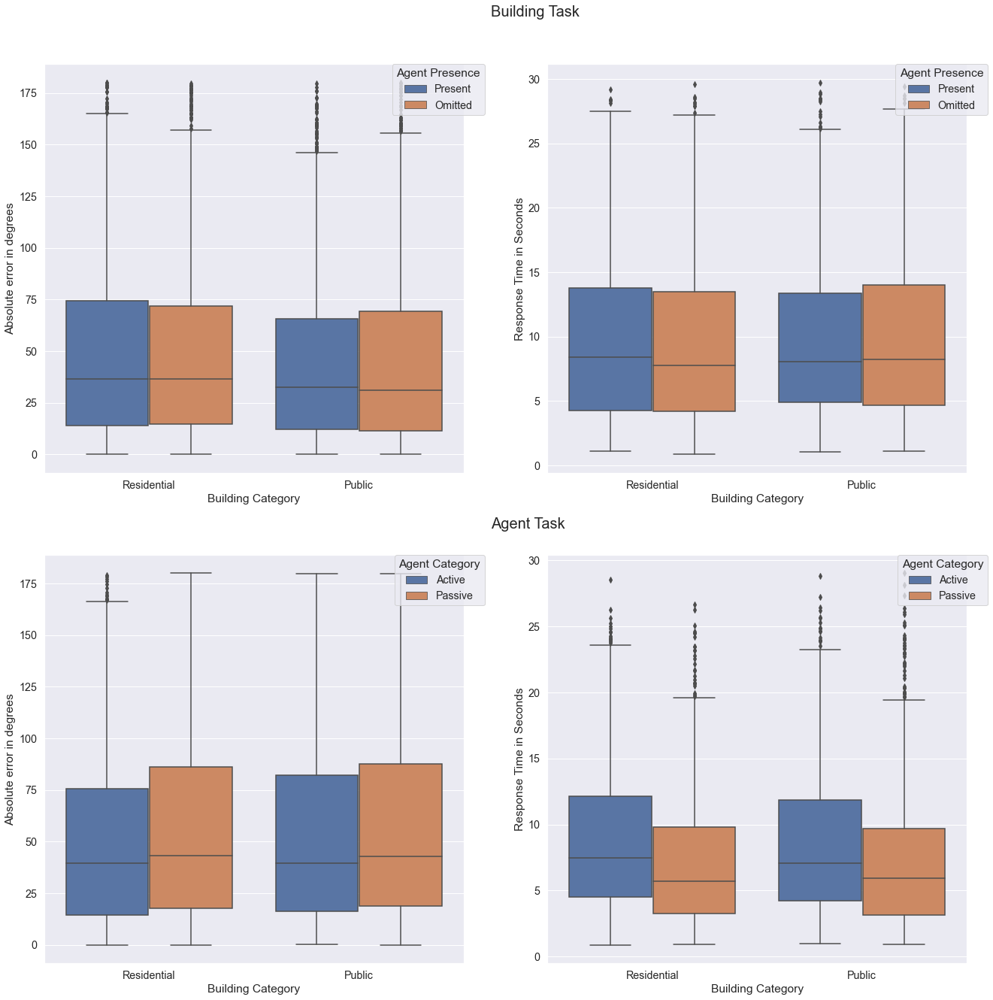

In [253]:
fig, axes = plt.subplots(2,2, figsize=(22,22))

# BUILDING TASK
sns.boxplot(x='Context_Building', y='AbsolutError_Building', hue='AvatarPresenceCategory_Building',  data=HumanAf_build,ax=axes[0][0], 
            order = [False, True] )

axes[0][0].set_xticklabels(['Residential', 'Public'])
axes[0][0].set_ylabel('Absolute error in degrees')
axes[0][0].set_xlabel('Building Category')
handles, labels = axes[0][0].get_legend_handles_labels()
#labels = ['Omitted', 'Present']
axes[0][0].legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=1, borderaxespad=0., title='Agent Presence')

sns.boxplot(x='Context_Building', y='RT_Building',hue='AvatarPresenceCategory_Building', dodge=True, data=HumanAf_build, ax=axes[0][1], 
    order = [False, True])
axes[0][1].set_xticklabels(['Residential', 'Public'])
axes[0][1].set_ylabel('Response Time in Seconds')
axes[0][1].set_xlabel('Building Category')
handles, labels = axes[0][1].get_legend_handles_labels()
axes[0][1].legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=1, borderaxespad=0., title='Agent Presence')

# AGENT TASK

sns.boxplot(x='Context_Agent', y='AbsolutError_Agent',  data=HumanAf_Agent,ax=axes[1][0], order = [False, True], hue = 'AgentCategory_Agent')

axes[1][0].set_xticklabels(['Residential', 'Public'])
axes[1][0].set_ylabel('Absolute error in degrees')
axes[1][0].set_xlabel('Building Category')
handles, labels = axes[1][0].get_legend_handles_labels()
#labels = ['Omitted', 'Present']
axes[1][0].legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=1, borderaxespad=0., title='Agent Category')

sns.boxplot(x='Context_Agent', y='RT_Agent',dodge=True, data=HumanAf_Agent, ax=axes[1][1], order = [False, True], hue = 'AgentCategory_Agent')
axes[1][1].set_xticklabels(['Residential', 'Public'])
axes[1][1].set_ylabel('Response Time in Seconds')
axes[1][1].set_xlabel('Building Category')
handles, labels = axes[1][1].get_legend_handles_labels()
axes[1][1].legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=1, borderaxespad=0., title='Agent Category')

fig.text(x=0.5, y=0.92, s="Building Task", fontsize = 20)
fig.text(x=0.5, y=0.49, s="Agent Task", fontsize = 20)

Text(0.5, 1.0, 'Agent Task')

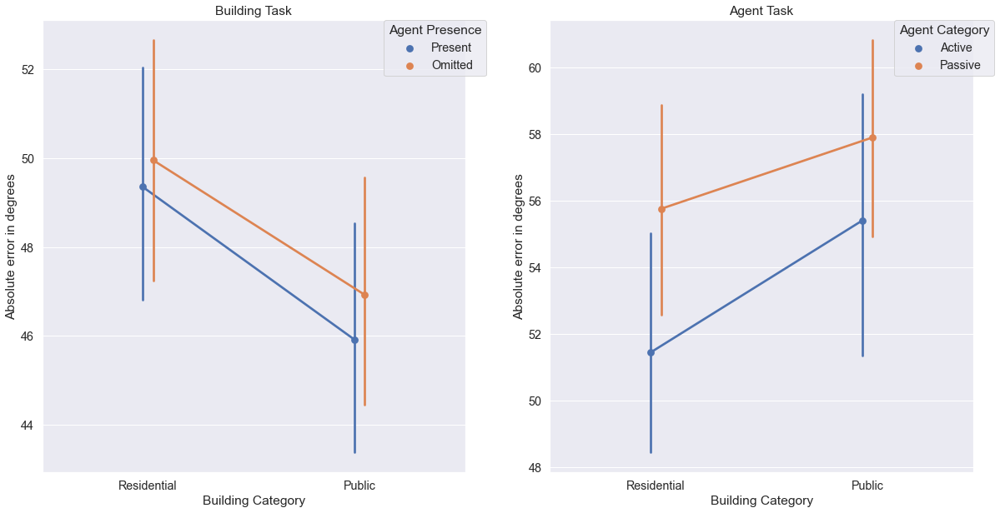

In [254]:
fig, axes = plt.subplots(1,2, figsize=(20,10))

g1 = sns.pointplot(x='Context_Building', y='AbsolutError_Building', hue='AvatarPresenceCategory_Building', dodge=True, data=HumanAf_build, 
    ci=95, ax = axes[0], order = [False, True])
handles, labels = g1.get_legend_handles_labels()
g1.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=1, borderaxespad=0., title='Agent Presence')
g1.set_xticklabels(['Residential', 'Public'])
g1.set_ylabel('Absolute error in degrees')
g1.set_xlabel('Building Category')
g1.set_title('Building Task')

g2 = sns.pointplot(x='Context_Agent', y='AbsolutError_Agent', hue='AgentCategory_Agent', dodge=True, data=HumanAf_Agent, 
    ci=95, ax = axes[1], order = [False, True])
handles, labels = g2.get_legend_handles_labels()
g2.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=1, borderaxespad=0., title='Agent Category')
g2.set_xticklabels(['Residential', 'Public'])
g2.set_ylabel('Absolute error in degrees')
g2.set_xlabel('Building Category')
g2.set_title('Agent Task')
#g.set_ylim(30, 60);

In [255]:
HumanAf_build.groupby(['Context_Building','AvatarPresenceCategory_Building'])['RT_Building'].agg([np.mean,np.median,np.std])

mean    median       std
Context_Building AvatarPresenceCategory_Building                              
False            Omitted                          9.464058  7.744552  6.393688
                 Present                          9.730402  8.409687  6.438893
True             Omitted                          9.973209  8.222187  6.467245
                 Present                          9.795992  8.080234  6.463385

In [256]:
HumanAf_Agent.groupby(['Context_Agent','AvatarPresenceCategory_Agent'])['RT_Agent'].agg([np.mean,np.median,np.std])

,,mean,median,std
Context_Agent,AvatarPresenceCategory_Agent,,,
False,Present,8.027354,6.500936,5.485566
True,Present,7.852711,6.482999,5.565215


Text(0.5, 1.0, 'Agent Task')

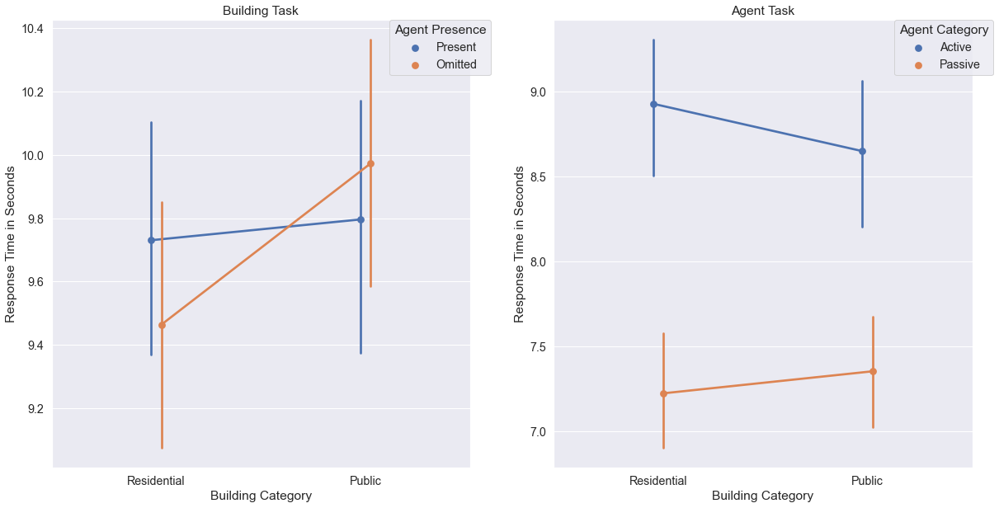

In [257]:
fig, axes = plt.subplots(1,2, figsize=(20,10))

g1 = sns.pointplot(x='Context_Building', y='RT_Building', hue='AvatarPresenceCategory_Building', dodge=True, data=HumanAf_build, ci=95, 
    order = [False, True], ax = axes[0])
handles, labels = g1.get_legend_handles_labels()
g1.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=1, borderaxespad=0., title='Agent Presence')
g1.set_xticklabels(['Residential', 'Public'])
g1.set_ylabel('Response Time in Seconds')
g1.set_xlabel('Building Category')
g1.set_title('Building Task')
#g.set_ylim(6, 10)

g2 = sns.pointplot(x='Context_Agent', y='RT_Agent', hue='AgentCategory_Agent', dodge=True, data=HumanAf_Agent, ci=95, 
    order = [False, True], ax = axes[1])
handles, labels = g2.get_legend_handles_labels()
g2.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=1, borderaxespad=0., title='Agent Category')
g2.set_xticklabels(['Residential', 'Public'])
g2.set_ylabel('Response Time in Seconds')
g2.set_xlabel('Building Category')
g2.set_title('Agent Task')
#g.set_ylim(6, 10)

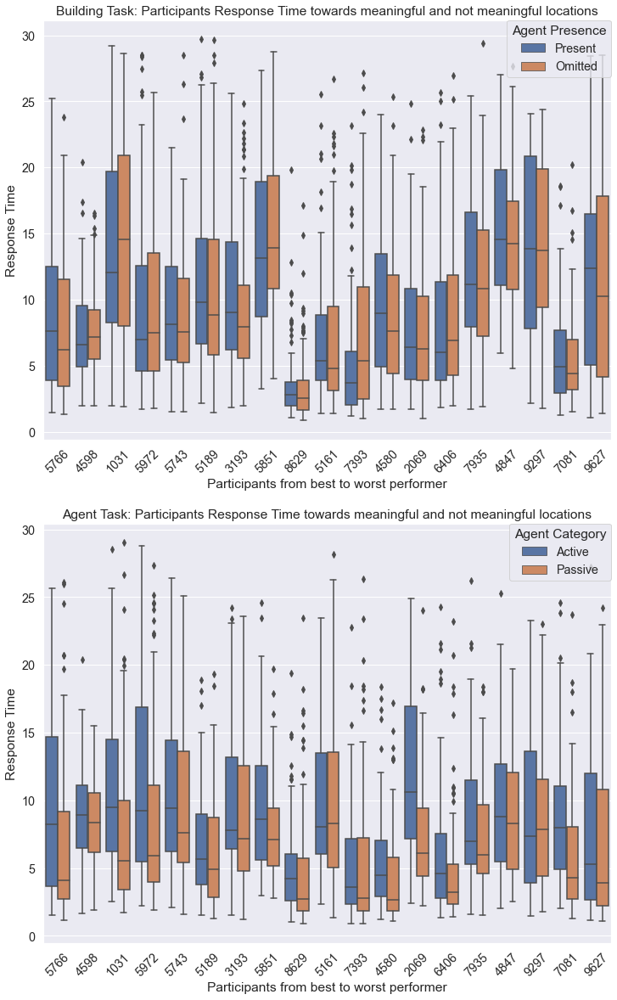

In [258]:
fig, axes = plt.subplots(2,1, figsize=(12,20))

sns.boxplot(x='ID', y='RT_Building', hue='AvatarPresenceCategory_Building', data=HumanAf_build, order=absolut_error_sorted_building.index.values, ax = axes[0])
axes[0].set_title('Building Task: Participants Response Time towards meaningful and not meaningful locations')
axes[0].set_xlabel('Participants from best to worst performer')
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45)
axes[0].set_ylabel('Response Time')
handles, labels = axes[0].get_legend_handles_labels()
#labels = ['Not present', 'Present']
axes[0].legend(handles, labels, loc= 'upper right', borderaxespad=0., title='Agent Presence')

sns.boxplot(x='ID', y='RT_Agent', hue='AgentCategory_Agent', data=HumanAf_Agent, order=absolut_error_sorted_building.index.values, ax = axes[1])
axes[1].set_title('Agent Task: Participants Response Time towards meaningful and not meaningful locations')
axes[1].set_xlabel('Participants from best to worst performer')
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45)
axes[1].set_ylabel('Response Time')
handles, labels = axes[1].get_legend_handles_labels()
#labels = ['Not present', 'Present']
axes[1].legend(handles, labels, loc= 'upper right', borderaxespad=0., title='Agent Category')
#ax.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc=1, borderaxespad=0., title='Agent Presence')

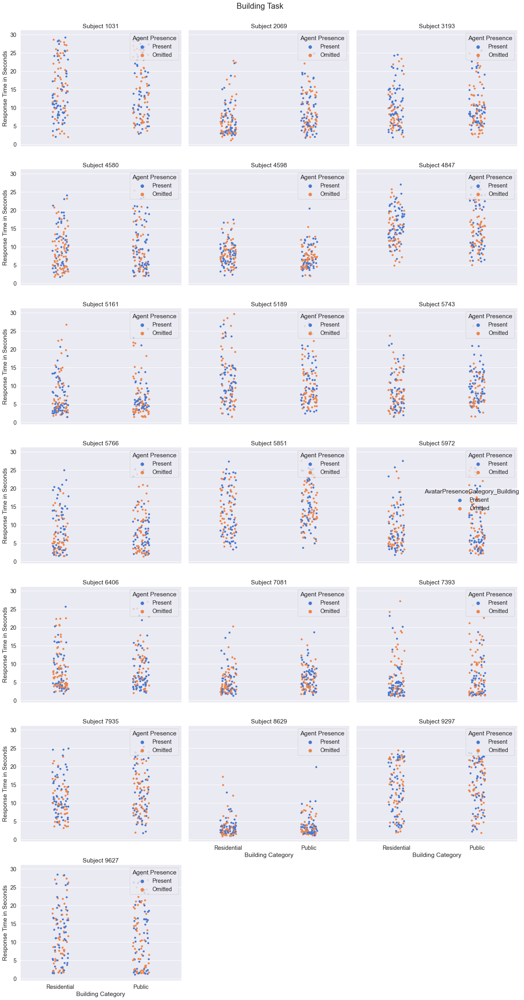

In [259]:
sns.set_palette('muted')
g = sns.catplot(x='Context_Building', y='RT_Building', hue='AvatarPresenceCategory_Building', dodge=False, data=HumanAf_build, 
    ci=95, col="ID", col_wrap=3, order = [False, True])
g.fig.suptitle("Building Task", x = 0.5, y = 1.0, fontsize = 20)
g.set_titles("Subject {col_name}")

for ax in g.axes.ravel():
    ax.legend(loc='upper right', title = 'Agent Presence')
    ax.set_xlabel("Building Category")
    ax.set_ylabel('Response Time in Seconds')
    ax.set_xticklabels(['Residential', 'Public'])

plt.tight_layout()

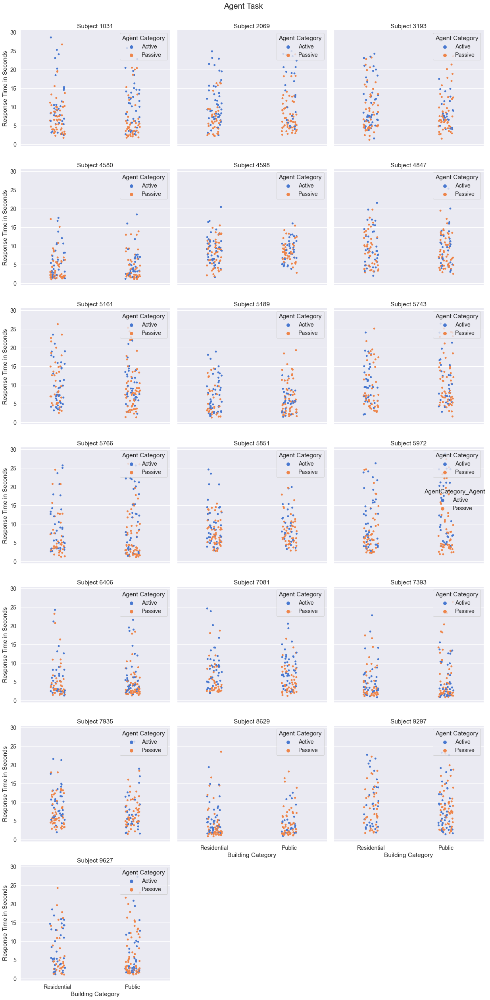

In [260]:
sns.set_palette('muted')
g = sns.catplot(x='Context_Agent', y='RT_Agent', hue='AgentCategory_Agent', dodge=False, data=HumanAf_Agent, ci=95, col="ID", col_wrap=3,
    order = [False, True])

g.fig.suptitle("Agent Task", x = 0.5, y = 1.0, fontsize = 20)
g.set_titles("Subject {col_name}")

for ax in g.axes.ravel():
    ax.legend(loc='upper right', title = 'Agent Category')
    ax.set_xlabel("Building Category")
    ax.set_ylabel('Response Time in Seconds')
    ax.set_xticklabels(['Residential', 'Public'])

plt.tight_layout()

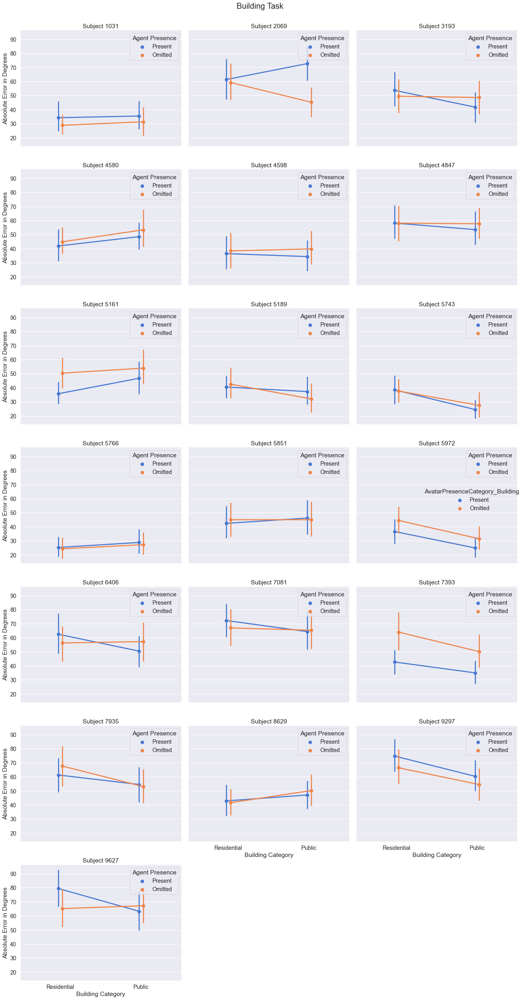

In [261]:
g = sns.catplot(x='Context_Building', y='AbsolutError_Building', hue='AvatarPresenceCategory_Building', dodge=True, data=HumanAf_build, ci=95, col="ID", col_wrap=3,
                kind="point", order = [False, True])
                
g.fig.suptitle("Building Task", x = 0.5, y = 1.0, fontsize = 20)
g.set_titles("Subject {col_name}")

for ax in g.axes.ravel():
    ax.legend(loc='upper right', title = 'Agent Presence')
    ax.set_xlabel("Building Category")
    ax.set_ylabel('Absolute Error in Degrees')
    ax.set_xticklabels(['Residential', 'Public'])

plt.tight_layout()

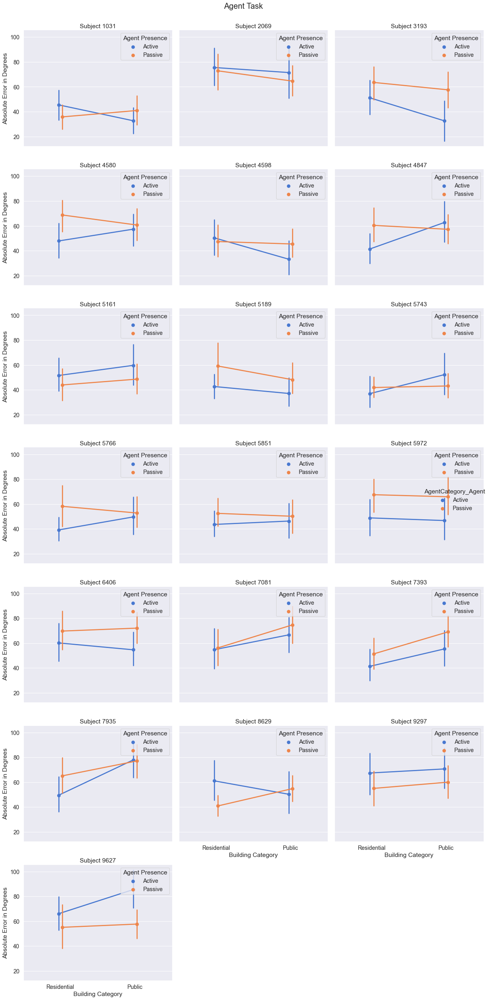

In [262]:
g = sns.catplot(x='Context_Agent', y='AbsolutError_Agent', hue='AgentCategory_Agent', dodge=True, data=HumanAf_Agent, ci=95, col="ID", col_wrap=3,
                kind="point", order = [False, True])

g.fig.suptitle("Agent Task", x = 0.5, y = 1.0, fontsize = 20)
g.set_titles("Subject {col_name}")

for ax in g.axes.ravel():
    ax.legend(loc='upper right', title = 'Agent Presence')
    ax.set_xlabel("Building Category")
    ax.set_ylabel('Absolute Error in Degrees')
    ax.set_xticklabels(['Residential', 'Public'])

plt.tight_layout()

c:\Users\Kaya\anaconda3\lib\site-packages\seaborn\regression.py:592: UserWarning: sharex is deprecated from the `lmplot` function signature. Please update your code to pass it using `facet_kws`.
  warnings.warn(msg, UserWarning)
c:\Users\Kaya\anaconda3\lib\site-packages\seaborn\regression.py:592: UserWarning: sharey is deprecated from the `lmplot` function signature. Please update your code to pass it using `facet_kws`.
  warnings.warn(msg, UserWarning)


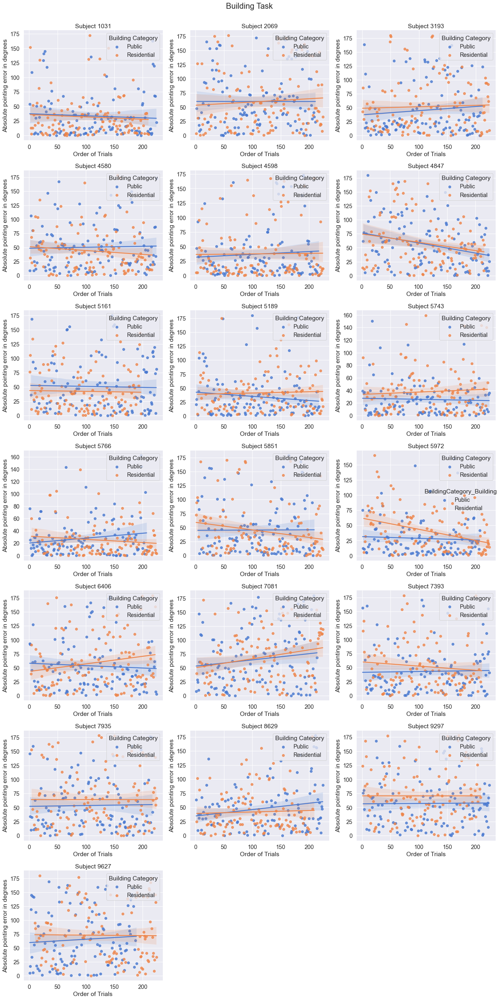

In [263]:
g = sns.lmplot(x="TrialNumber_Building", y="AbsolutError_Building", data=HumanAf_build, hue='BuildingCategory_Building',col="ID", col_wrap=3, sharex=False, sharey=False)
g.fig.suptitle("Building Task", x = 0.5, y = 1.0, fontsize = 20)
g.set_titles("Subject {col_name}")

for ax in g.axes.ravel():
    ax.legend(loc='upper right', title = 'Building Category')
    ax.set_xlabel("Order of Trials")
    ax.set_ylabel('Absolute pointing error in degrees')

plt.tight_layout()

c:\Users\Kaya\anaconda3\lib\site-packages\seaborn\regression.py:592: UserWarning: sharex is deprecated from the `lmplot` function signature. Please update your code to pass it using `facet_kws`.
  warnings.warn(msg, UserWarning)
c:\Users\Kaya\anaconda3\lib\site-packages\seaborn\regression.py:592: UserWarning: sharey is deprecated from the `lmplot` function signature. Please update your code to pass it using `facet_kws`.
  warnings.warn(msg, UserWarning)


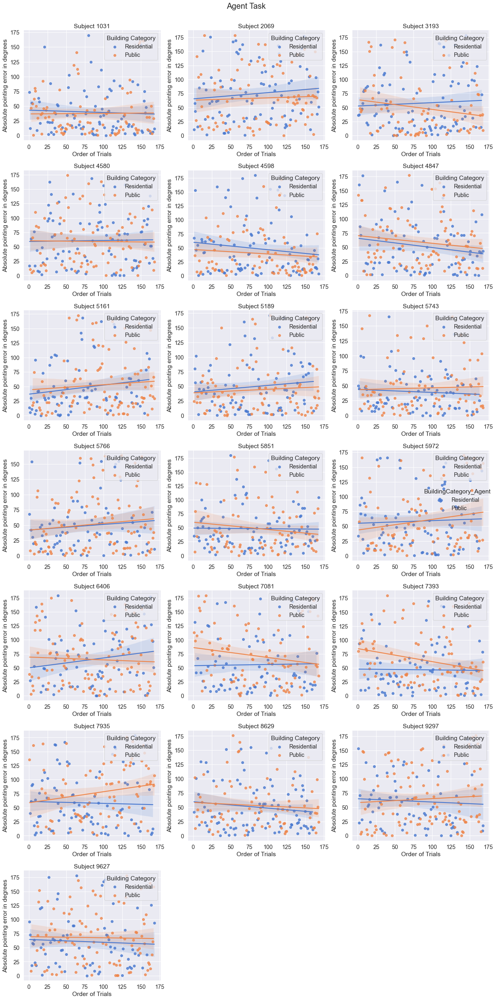

In [264]:
g = sns.lmplot(x="TrialNumber_Agent", y="AbsolutError_Agent", data=HumanAf_Agent, hue='BuildingCategory_Agent',col="ID", col_wrap=3, sharex=False, sharey=False)
g.fig.suptitle("Agent Task", x = 0.5, y = 1.0, fontsize = 20)
g.set_titles("Subject {col_name}")

for ax in g.axes.ravel():
    ax.legend(loc='upper right', title = 'Building Category')
    ax.set_xlabel("Order of Trials")
    ax.set_ylabel('Absolute pointing error in degrees')

plt.tight_layout()

#FRS

Text(0.5, 0.49, 'Agent Task')

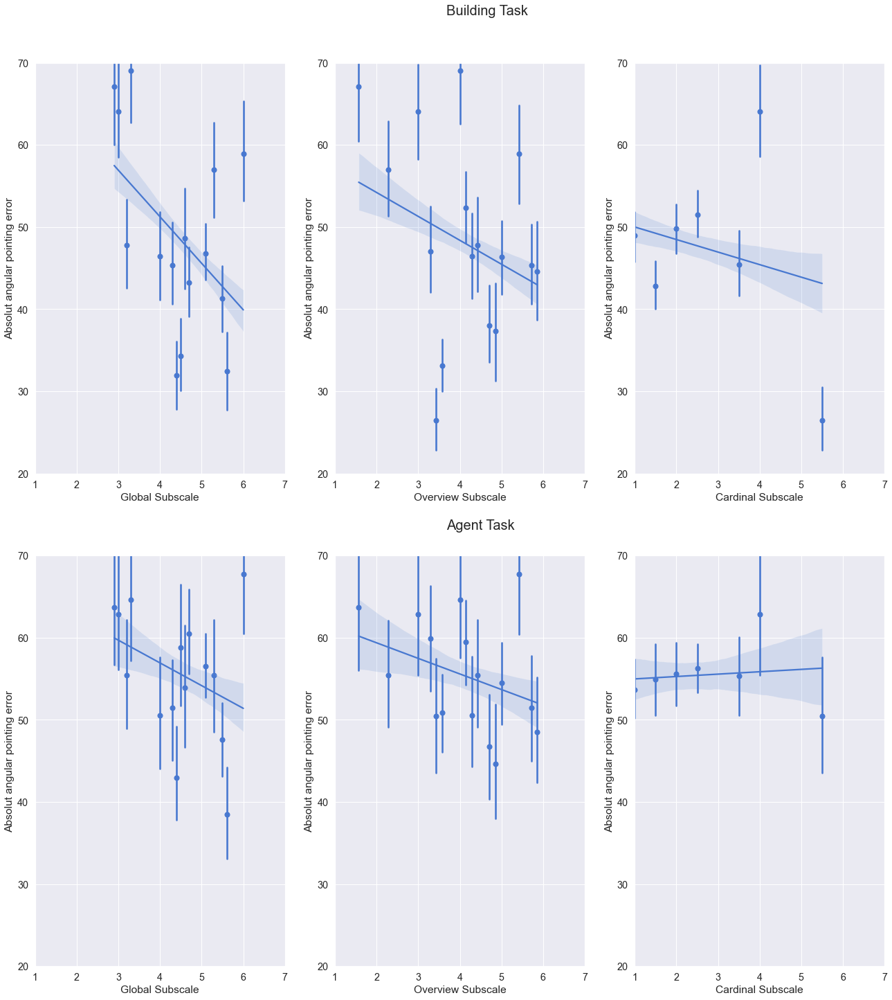

In [265]:
fig, axes = plt.subplots(2,3, figsize=(22,24))

sns.regplot(data=HumanAf_build, x='Global',   y='AbsolutError_Building', x_bins=23, ax=axes[0][0]).set(xlabel='Global Subscale')
sns.regplot(data=HumanAf_build, x='Overview', y='AbsolutError_Building', x_bins=23, ax=axes[0][1]).set(xlabel='Overview Subscale')
sns.regplot(data=HumanAf_build, x='Cardinal', y='AbsolutError_Building', x_bins=23, ax=axes[0][2]).set(xlabel='Cardinal Subscale')

sns.regplot(data=HumanAf_Agent, x='Global',   y='AbsolutError_Agent', x_bins=23, ax=axes[1][0]).set(xlabel='Global Subscale')
sns.regplot(data=HumanAf_Agent, x='Overview', y='AbsolutError_Agent', x_bins=23, ax=axes[1][1]).set(xlabel='Overview Subscale')
sns.regplot(data=HumanAf_Agent, x='Cardinal', y='AbsolutError_Agent', x_bins=23, ax=axes[1][2]).set(xlabel='Cardinal Subscale')

#axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45);
for ax in axes.ravel():
    ax.set_xlim(1, 7)
    ax.set_ylim(20,70)
    ax.set_ylabel('Absolut angular pointing error')

fig.text(x=0.5, y=0.92, s="Building Task", fontsize = 20)
fig.text(x=0.5, y=0.49, s="Agent Task", fontsize = 20)

In [266]:
#Mean absolut error by participant sorted from best to worst performer
absolut_error_mean_sorted_build = pd.DataFrame(HumanAf_build.groupby(['ID'])['AbsolutError_Building'].mean().sort_values())
absolut_error_mean_sorted_build.reset_index(inplace=True)
absolut_error_mean_sorted_build.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19 entries, 0 to 18
Data columns (total 2 columns):
 #   Column                 Non-Null Count  Dtype   
---  ------                 --------------  -----   
 0   ID                     19 non-null     category
 1   AbsolutError_Building  19 non-null     float64 
dtypes: category(1), float64(1)
memory usage: 1007.0 bytes


In [267]:
#Mean absolut error by participant sorted from best to worst performer
absolut_error_mean_sorted_agent = pd.DataFrame(HumanAf_Agent.groupby(['ID'])['AbsolutError_Agent'].mean().sort_values())
absolut_error_mean_sorted_agent.reset_index(inplace=True)
absolut_error_mean_sorted_agent.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19 entries, 0 to 18
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   ID                  19 non-null     category
 1   AbsolutError_Agent  19 non-null     float64 
dtypes: category(1), float64(1)
memory usage: 1007.0 bytes


In [268]:
FRS = pd.read_csv('E:\HumanA\Data\Data_Tracy\Questionnaires\Adjusted\FRSsubs.csv')
FRS_merged_build = pd.merge(absolut_error_mean_sorted_build,FRS,on=['ID'])
FRS_merged_build = pd.merge(absolut_error_sorted_building,FRS_merged_build,on=['ID'])
FRS_merged_build.rename(columns={
    FRS_merged_build.columns[1]: 'Mean absolute pointing error',
    FRS_merged_build.columns[2]: 'Median of absolute pointing error'}, inplace=True)
FRS_merged_build.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19 entries, 0 to 18
Data columns (total 8 columns):
 #   Column                             Non-Null Count  Dtype   
---  ------                             --------------  -----   
 0   ID                                 19 non-null     category
 1   Mean absolute pointing error       19 non-null     float64 
 2   Median of absolute pointing error  19 non-null     float64 
 3   Unnamed: 0                         19 non-null     int64   
 4   Alter                              19 non-null     int64   
 5   Global                             19 non-null     float64 
 6   Overview                           19 non-null     float64 
 7   Cardinal                           19 non-null     float64 
dtypes: category(1), float64(5), int64(2)
memory usage: 1.9 KB


In [269]:
FRS = pd.read_csv('E:\HumanA\Data\Data_Tracy\Questionnaires\Adjusted\FRSsubs.csv')
FRS_merged_agent = pd.merge(absolut_error_mean_sorted_agent,FRS,on=['ID'])
FRS_merged_agent = pd.merge(absolut_error_sorted_agent,FRS_merged_agent,on=['ID'])
FRS_merged_agent.rename(columns={
    FRS_merged_agent.columns[1]: 'Mean absolute pointing error',
    FRS_merged_agent.columns[2]: 'Median of absolute pointing error'}, inplace=True)
FRS_merged_agent.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19 entries, 0 to 18
Data columns (total 8 columns):
 #   Column                             Non-Null Count  Dtype   
---  ------                             --------------  -----   
 0   ID                                 19 non-null     category
 1   Mean absolute pointing error       19 non-null     float64 
 2   Median of absolute pointing error  19 non-null     float64 
 3   Unnamed: 0                         19 non-null     int64   
 4   Alter                              19 non-null     int64   
 5   Global                             19 non-null     float64 
 6   Overview                           19 non-null     float64 
 7   Cardinal                           19 non-null     float64 
dtypes: category(1), float64(5), int64(2)
memory usage: 1.9 KB


Text(0.5, 0.98, 'Building Task')

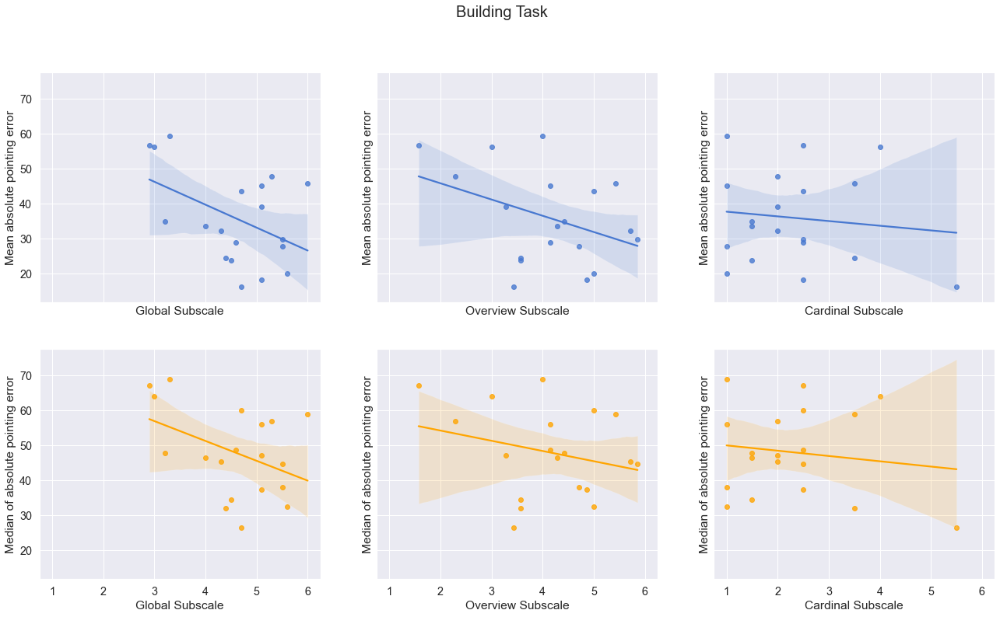

In [270]:
fig, axes = plt.subplots(nrows=2,ncols=3, figsize=(22,12), sharex=True, sharey=True)
sns.regplot(data=FRS_merged_build, x='Global', y='Mean absolute pointing error',  ax=axes[0,0]).set(xlabel='Global Subscale')
sns.regplot(data=FRS_merged_build, x='Overview', y='Mean absolute pointing error', ax=axes[0,1]).set(xlabel='Overview Subscale')
sns.regplot(data=FRS_merged_build, x='Cardinal', y='Mean absolute pointing error', ax=axes[0,2]).set(xlabel='Cardinal Subscale')
sns.regplot(data=FRS_merged_build, x='Global', y='Median of absolute pointing error', color='orange' ,  ax=axes[1,0]).set(xlabel='Global Subscale')
sns.regplot(data=FRS_merged_build, x='Overview', y='Median of absolute pointing error', color='orange',ax=axes[1,1]).set(xlabel='Overview Subscale')
sns.regplot(data=FRS_merged_build, x='Cardinal', y='Median of absolute pointing error',color='orange' , ax=axes[1,2]).set(xlabel='Cardinal Subscale')
fig.suptitle('Building Task', fontsize=20)

Text(0.5, 0.98, 'Agent Task')

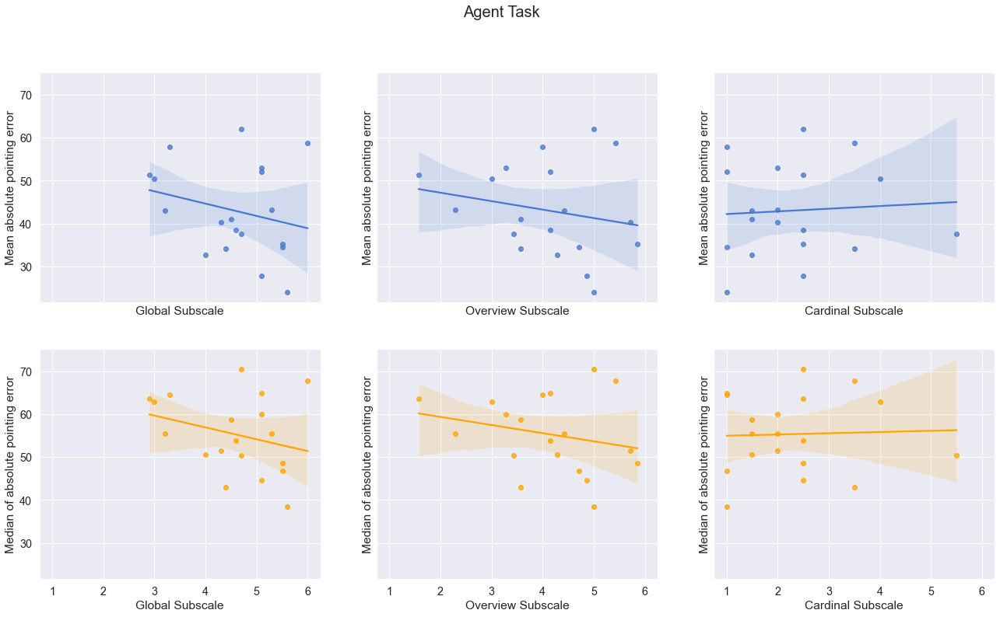

In [271]:
fig, axes = plt.subplots(nrows=2,ncols=3, figsize=(22,12), sharex=True, sharey=True)
sns.regplot(data=FRS_merged_agent, x='Global', y='Mean absolute pointing error',  ax=axes[0,0]).set(xlabel='Global Subscale')
sns.regplot(data=FRS_merged_agent, x='Overview', y='Mean absolute pointing error', ax=axes[0,1]).set(xlabel='Overview Subscale')
sns.regplot(data=FRS_merged_agent, x='Cardinal', y='Mean absolute pointing error', ax=axes[0,2]).set(xlabel='Cardinal Subscale')
sns.regplot(data=FRS_merged_agent, x='Global', y='Median of absolute pointing error', color='orange' ,  ax=axes[1,0]).set(xlabel='Global Subscale')
sns.regplot(data=FRS_merged_agent, x='Overview', y='Median of absolute pointing error', color='orange',ax=axes[1,1]).set(xlabel='Overview Subscale')
sns.regplot(data=FRS_merged_agent, x='Cardinal', y='Median of absolute pointing error',color='orange' , ax=axes[1,2]).set(xlabel='Cardinal Subscale')
fig.suptitle('Agent Task', fontsize=20)